# Fingerprint-based similarity scores - percentile scaling for better comparison

## Challenge
1. Many different fingerprints AND possible variations thereof (e.g. count/binary, log, weighted...) AND different metrics lead to **a lot** of possible variations!
2. No ground truth, so it is hard to measure what is good and what is better...

Data:

Compare multiple fingerprints on the "ms2 structures" dataset [Bushuiev 2024].

In [46]:
import os
from pathlib import Path
import random
import pickle
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm

#from matchms.importing import load_from_mgf

ROOT = Path(os.getcwd()).parents[0]

path_data = os.path.join(Path(ROOT), "data")

In [2]:
filename = "compounds_unique_inchikey14.pickle"
compounds = pd.read_pickle(os.path.join(path_data, filename))
compounds.head()

,inchikey,inchi,smiles,spectrum_id
0,AAAQFGUYHFJNHI,InChI=1S/C22H22ClN5O2/c1-4-24-20(29)12-18-22-2...,CCNC(=O)C[C@@H]1N=C(c2ccc(Cl)cc2)c2c(ccc(OC)c2...,None
1,AABFWJDLCCDJJN,InChI=1S/C22H16N2O/c1-25-15-9-10-20-19(13-15)1...,COc1cc2c(cc1)[nH]c1c2ccnc1-c1cccc2ccccc12,None
2,AABILZKQMVKFHP,InChI=1S/C21H33NO8/c1-7-13(2)18(23)30-16-9-11-...,C/C=C(/C)\C(=O)O[C@H]1CC[N+]2([C@@H]1C(=CC2)CO...,MSBNK-NaToxAq-NA003250
3,AABUHSBGEIUSRJ,InChI=1S/C17H16N2O2/c1-13(20)18-15-8-10-16(11-...,CC(O)=Nc1ccc(NC(=O)C=Cc2ccccc2)cc1,CCMSLIB00010107357
4,AABUKWVVUWBZCS,InChI=1S/C21H14O3/c22-16-11-12-17-18(13-16)24-...,O=c1oc2cc(O)ccc2c(-c2ccccc2)c1-c1ccccc1,CCMSLIB00010104862


In [3]:
from rdkit import Chem
from rdkit.Chem import Descriptors
from rdkit.Chem import rdFingerprintGenerator

def calculate_mass(smiles):
    # Convert SMILES string to a molecule object
    molecule = Chem.MolFromSmiles(smiles)
    if molecule is None:
        return "Invalid SMILES"
    # Calculate the molecular mass
    mass = Descriptors.MolWt(molecule)
    return mass

In [4]:
masses = []
for smiles_string in tqdm(compounds.smiles):
    masses.append(calculate_mass(smiles_string))

  0%|          | 0/37663 [00:00<?, ?it/s]

In [5]:
compounds["mass"] = masses
compounds.head()

,inchikey,inchi,smiles,spectrum_id,mass
0,AAAQFGUYHFJNHI,InChI=1S/C22H22ClN5O2/c1-4-24-20(29)12-18-22-2...,CCNC(=O)C[C@@H]1N=C(c2ccc(Cl)cc2)c2c(ccc(OC)c2...,None,423.904
1,AABFWJDLCCDJJN,InChI=1S/C22H16N2O/c1-25-15-9-10-20-19(13-15)1...,COc1cc2c(cc1)[nH]c1c2ccnc1-c1cccc2ccccc12,None,324.383
2,AABILZKQMVKFHP,InChI=1S/C21H33NO8/c1-7-13(2)18(23)30-16-9-11-...,C/C=C(/C)\C(=O)O[C@H]1CC[N+]2([C@@H]1C(=CC2)CO...,MSBNK-NaToxAq-NA003250,427.494
3,AABUHSBGEIUSRJ,InChI=1S/C17H16N2O2/c1-13(20)18-15-8-10-16(11-...,CC(O)=Nc1ccc(NC(=O)C=Cc2ccccc2)cc1,CCMSLIB00010107357,280.327
4,AABUKWVVUWBZCS,InChI=1S/C21H14O3/c22-16-11-12-17-18(13-16)24-...,O=c1oc2cc(O)ccc2c(-c2ccccc2)c1-c1ccccc1,CCMSLIB00010104862,314.340


In [6]:
from utils import FingerprintGenerator #, fingerprint_from_smiles #, compute_all_fingerprints

In [7]:
from rdkit.Chem import rdFingerprintGenerator
from rdkit import Chem


def compute_fingerprints(fpgen, count):
    fp_generator = FingerprintGenerator(fpgen)
    
    fingerprints = []
    for inchikey, row in tqdm(compounds.iterrows(), total=len(compounds)):
        fp = fp_generator.fingerprint_from_smiles(row.smiles, count)
        if fp is None:
            print(f"Missing fingerprint for {inchikey}: {row.smiles}")
        else:
            fingerprints.append(fp)
    return np.vstack(fingerprints)  

In [39]:
similarities_rdkit = np.load("similarities_tanimoto_rdkit_4096bits.npy")

In [40]:
similarities_morgan3_count = np.load("similarities_ruzicka_morgan3_4096bits.npy")

## Morgan-3 binary + Tanimoto

In [41]:
similarities_morgan3 = np.load("similarities_tanimoto_morgan3_4096bits.npy")

## Morgan-6 count

In [69]:
# too big! --> 5 GB !!
similarities_morgan6_count = np.load("similarities_ruzicka_morgan6_4096bits.npy",)

## Morgan-9 count

In [28]:
similarities_morgan9_count = np.load("similarities_ruzicka_morgan9_4096bits.npy")

## MAP4

In [112]:
from typing import List
from rdkit.Chem import Mol, MolFromSmiles # pylint: disable=import-error,no-name-in-module
from map4 import MAP4


map4 = MAP4(
    dimensions=4096,
    radius=2,
    include_duplicated_shingles=False,
)

molecules: List[Mol] = [MolFromSmiles(smiles) for smiles in tqdm(compounds.smiles.values)]
fingerprints_map4: np.ndarray = map4.calculate_many(
    molecules,
    number_of_threads=32,
    verbose=True,
)

  0%|          | 0/37663 [00:00<?, ?it/s]

Calculating fingerprints:   0%|                       | 0/37663 [00:00<?, ?it/s]

In [113]:
fingerprints_map4.shape

(37663, 4096)

In [119]:
from metrics import jaccard_similarity_matrix

In [120]:
%%time

similarities_map4 = jaccard_similarity_matrix(fingerprints_map4, fingerprints_map4)

CPU times: user 3min 54s, sys: 1min 21s, total: 5min 15s
Wall time: 15.2 s


## Compare score distributions

Things to consider:
- remove the diagonal (to not count the pairs of compounds with themselves)
- different scores will scale very differently -- adjust scale/align between all scores!

In [9]:
#from utils import remove_diagonal

def remove_diagonal(A):
    m = A.shape[0]
    strided = np.lib.stride_tricks.as_strided
    s0,s1 = A.strides
    return strided(A.ravel()[1:], shape=(m-1,m), strides=(s0+s1,s1)).reshape(m,-1)



def compare_distributions(
    similarities1,
    similarities2,
    label1,
    label2,
    title="",
    ignore_diagonal=True
):
    if ignore_diagonal:
        similarities1 = remove_diagonal(similarities1)
        similarities2 = remove_diagonal(similarities2)

    fig, ax = plt.subplots(1, figsize=(8, 5))
    ax.hist(similarities1.reshape(-1),
                    bins=50, rwidth=0.8, alpha=0.5, label=label1)
    ax.hist(similarities2.reshape(-1),
                    bins=50, rwidth=0.8, alpha=0.5, label=label2)
    ax.set_title(title)
    ax.set_xlabel("Tanimoto(-like) score")
    ax.set_ylabel("Score counts")
    
    ax.set_yscale("log")
    ax.set_yscale("log")
    plt.legend()
    plt.show()

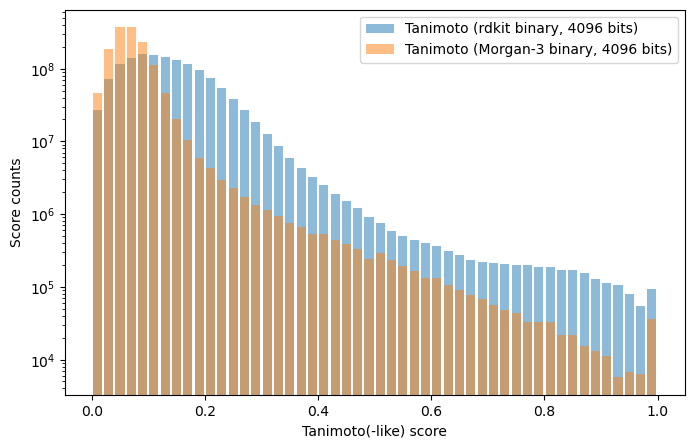

In [13]:
NBITS = 4096

compare_distributions(
    similarities_classic,
    similarities_morgan3,
    f"Tanimoto (rdkit binary, {NBITS} bits)",
    f"Tanimoto (Morgan-3 binary, {NBITS} bits)",
    ignore_diagonal=True,
)

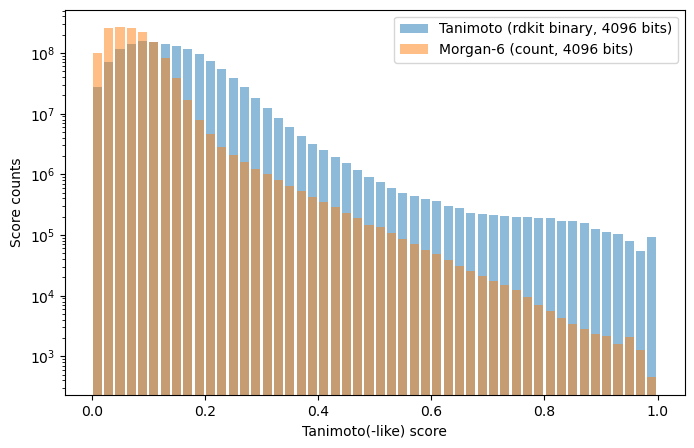

In [29]:
NBITS = 4096

compare_distributions(similarities_rdkit,
                      similarities_count_morgan6,
                      f"Tanimoto (rdkit binary, {NBITS} bits)",
                      f"Morgan-6 (count, {NBITS} bits)",
)

In [17]:
100 * (similarities_morgan3_count > 0.8).sum() / similarities_rdkit.shape[0]**2

np.float64(0.008715182464489752)

In [16]:
100 * (similarities_rdkit > 0.8).sum() / similarities_rdkit.shape[0]**2

np.float64(0.09088442538056861)

## Adjust different score scales!

The two distributions above show that there is a huge discrepancy in how the scores are distributet. That also means: in how likely it is for a molecular pair to obtain a certain score!

**AIM**: bring all scores to the same overall distribution!?

### Adjust all to the same distribution --> use percentiles!

In [11]:
from utils import percentile_scores

In [15]:
%%time

scaled_similarities_rdkit = percentile_scores(similarities_rdkit)

CPU times: user 1min 24s, sys: 6.36 s, total: 1min 31s
Wall time: 1min 31s


In [18]:
scaled_similarities_rdkit.shape, scaled_similarities_rdkit.dtype

((37663, 37663), dtype('float64'))

In [19]:
scaled_similarities_rdkit[:5, :5]

array([[ 0.        , 68.36077614, 87.90876007, 32.84831871, 68.65481527],
       [68.36077614,  0.        , 57.54425578, 20.41642739, 81.85514836],
       [87.90876007, 57.54425578,  0.        , 24.12357248, 59.24575117],
       [32.84831871, 20.41642739, 24.12357248,  0.        , 21.76288745],
       [68.65481527, 81.85514836, 59.24575117, 21.76288745,  0.        ]])

In [ ]:
%%time

scaled_similarities_morgan3 = percentile_scores(similarities_morgan3)

In [12]:
%%time

scaled_similarities_morgan3_count = percentile_scores(similarities_morgan3_count)

CPU times: user 2min 23s, sys: 6.83 s, total: 2min 30s
Wall time: 2min 30s


In [29]:
%%time

scaled_similarities_morgan9_count = percentile_scores(similarities_morgan9_count)

CPU times: user 2min 19s, sys: 6.71 s, total: 2min 26s
Wall time: 2min 26s


In [57]:
%%time

scaled_similarities_map4 = percentile_scores(similarities_map4)

CPU times: user 1min 32s, sys: 6.41 s, total: 1min 38s
Wall time: 1min 38s


In [58]:
#np.save("scaled_similarities_tanimoto_rdkit_4096bits.npy", scaled_similarities_rdkit.astype(np.float32))
#np.save("scaled_similarities_tanimoto_morgan3_4096bits.npy", scaled_similarities_morgan3.astype(np.float32))
#np.save("scaled_similarities_ruzicka_morgan3_4096bits.npy", scaled_similarities_morgan3_count.astype(np.float32))
#np.save("scaled_similarities_ruzicka_morgan9_4096bits.npy", scaled_similarities_morgan9_count.astype(np.float32))
#np.save("scaled_similarities_tanimoto_map4_4096bits.npy", scaled_similarities_map4.astype(np.float32))

In [5]:
scaled_similarities_rdkit = np.load("scaled_similarities_tanimoto_rdkit_4096bits.npy")
scaled_similarities_morgan3 = np.load("scaled_similarities_tanimoto_morgan3_4096bits.npy")
scaled_similarities_morgan3_count = np.load("scaled_similarities_ruzicka_morgan3_4096bits.npy")
scaled_similarities_morgan9_count = np.load("scaled_similarities_ruzicka_morgan9_4096bits.npy")
scaled_similarities_map4 = np.load("scaled_similarities_tanimoto_map4_4096bits.npy")

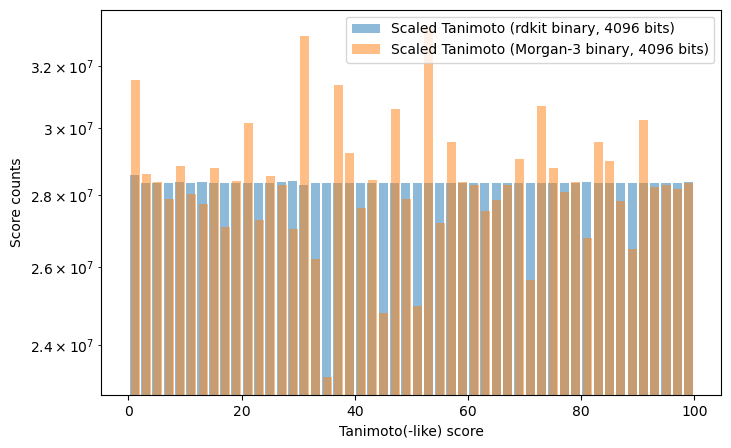

In [15]:
NBITS = 4096

compare_distributions(
    scaled_similarities_rdkit,
    scaled_similarities_morgan3,
    f"Scaled Tanimoto (rdkit binary, {NBITS} bits)",
    f"Scaled Tanimoto (Morgan-3 binary, {NBITS} bits)",
    ignore_diagonal=True,
)

## Compare score vs. score using heatmap

## Score Percentile Comparisons

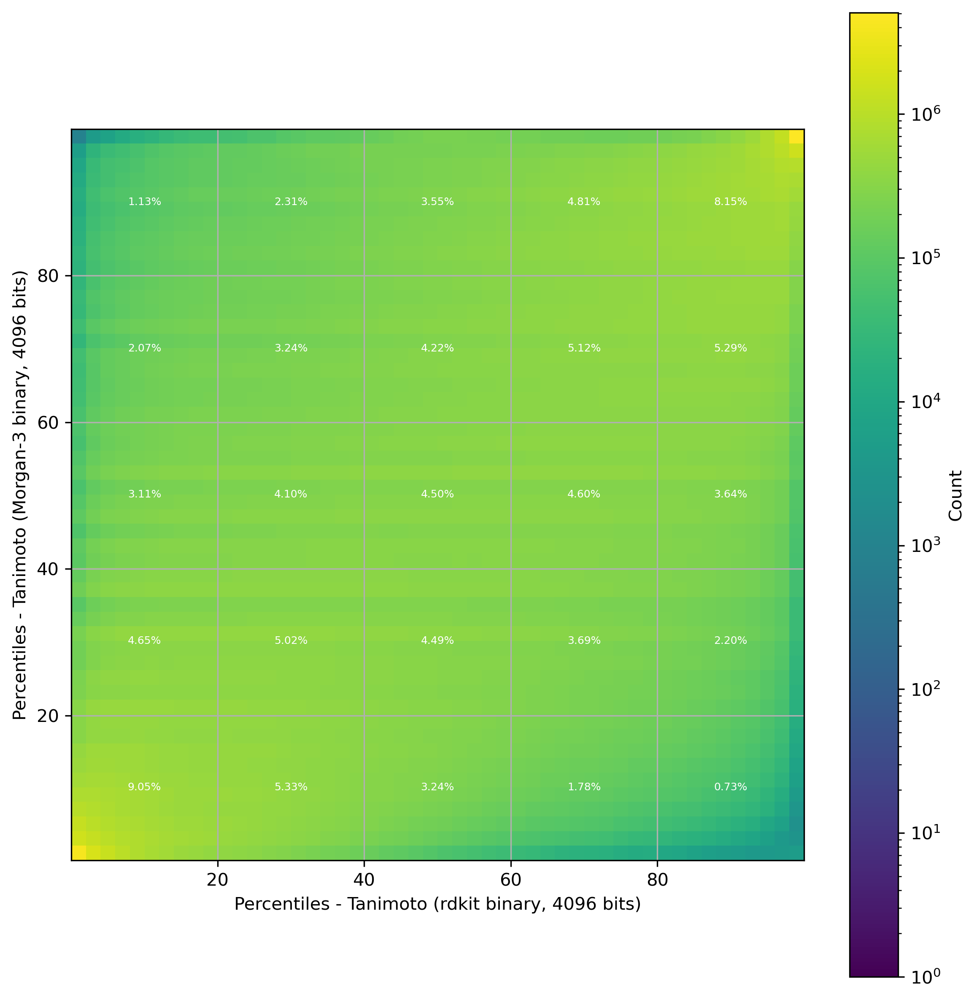

In [53]:
NBITS = 4096

heatmap_comparison(
    scaled_similarities_rdkit,
    scaled_similarities_morgan3,
    f"Percentiles - Tanimoto (rdkit binary, {NBITS} bits)",
    f"Percentiles - Tanimoto (Morgan-3 binary, {NBITS} bits)",
    bins=50,
    #colormap="inferno",
    filename="heatmap_scaled_tanimoto_rdkit_vs_scaled_tanimoto_morgan3.png"
)

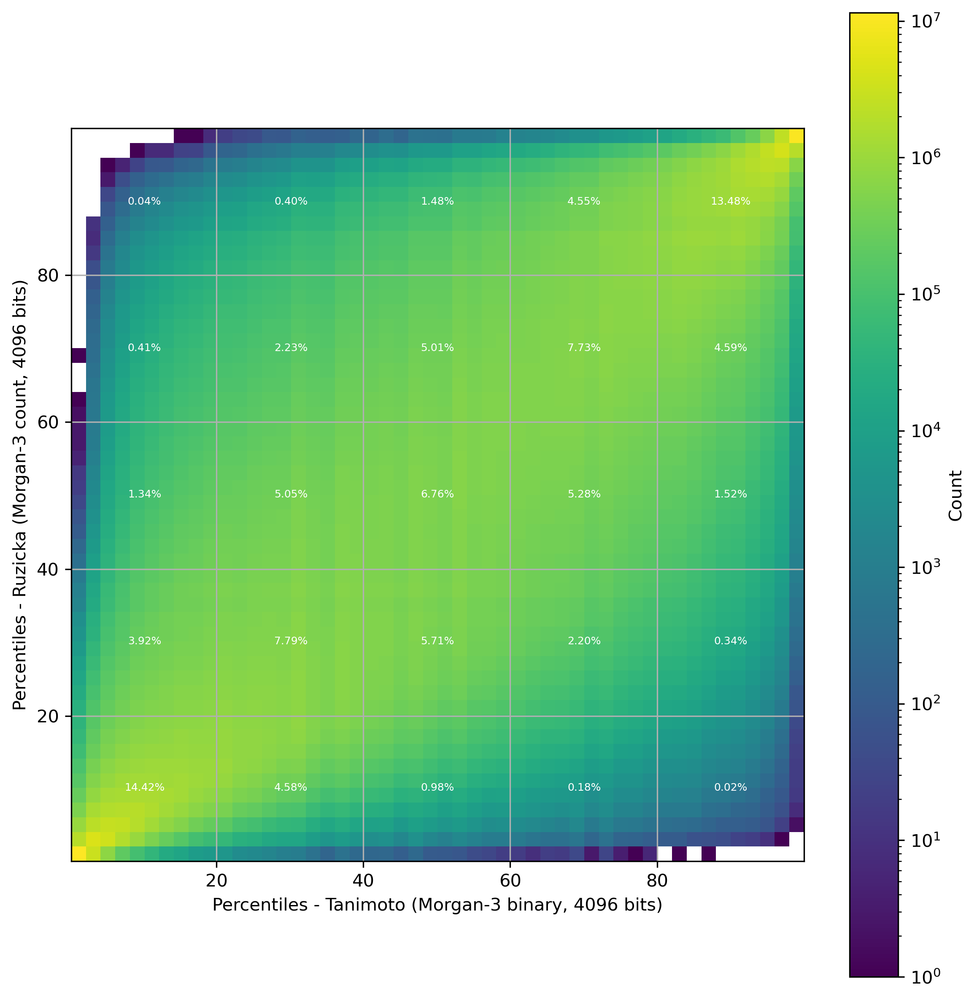

In [54]:
NBITS = 4096

heatmap_comparison(
    scaled_similarities_morgan3,
    scaled_similarities_morgan3_count,
    f"Percentiles - Tanimoto (Morgan-3 binary, {NBITS} bits)",
    f"Percentiles - Ruzicka (Morgan-3 count, {NBITS} bits)",
    bins=50,
    #colormap="inferno",
    filename="heatmap_scaled_tanimoto_morgan3_vs_scaled_ruzicka_morgan3.png"
)

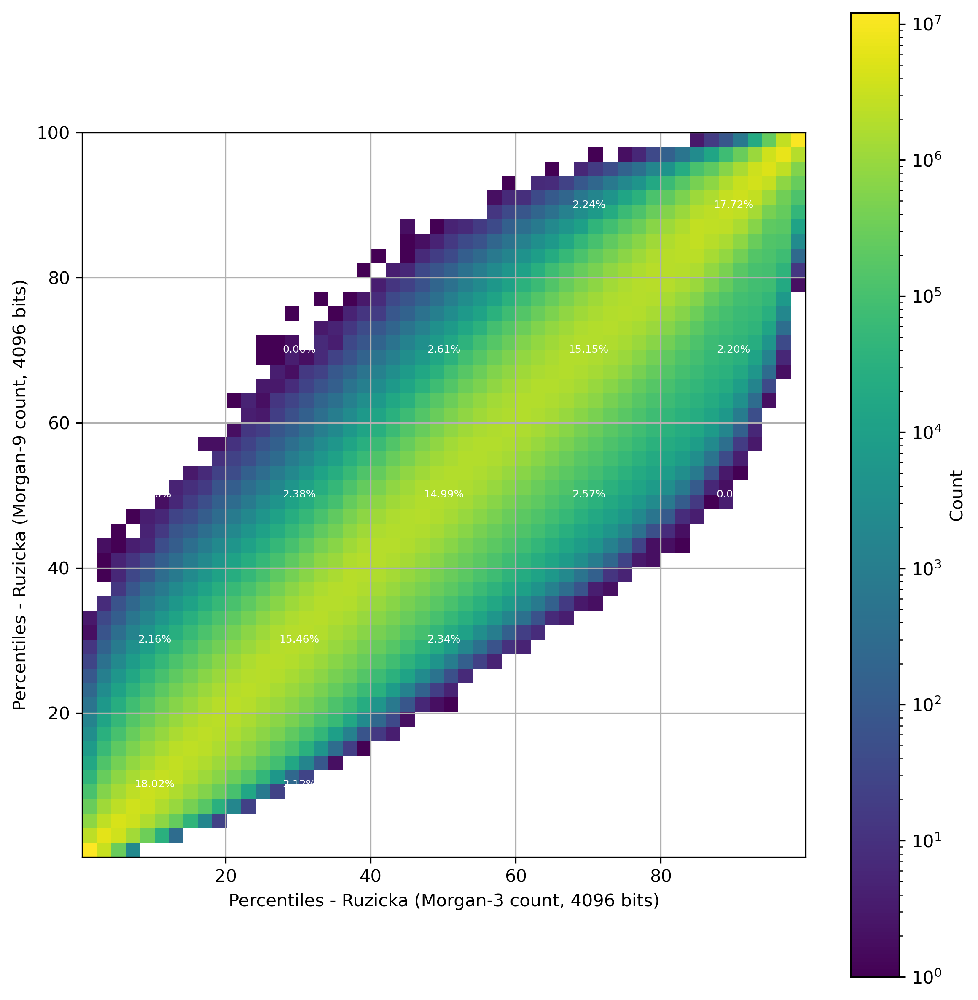

In [56]:
NBITS = 4096

heatmap_comparison(
    scaled_similarities_morgan3_count,
    scaled_similarities_morgan9_count,
    f"Percentiles - Ruzicka (Morgan-3 count, {NBITS} bits)",
    f"Percentiles - Ruzicka (Morgan-9 count, {NBITS} bits)",
    bins=50,
    #colormap="inferno",
    filename="heatmap_scaled_ruzicka_morgan3_vs_scaled_ruzicka_morgan9.png"
)

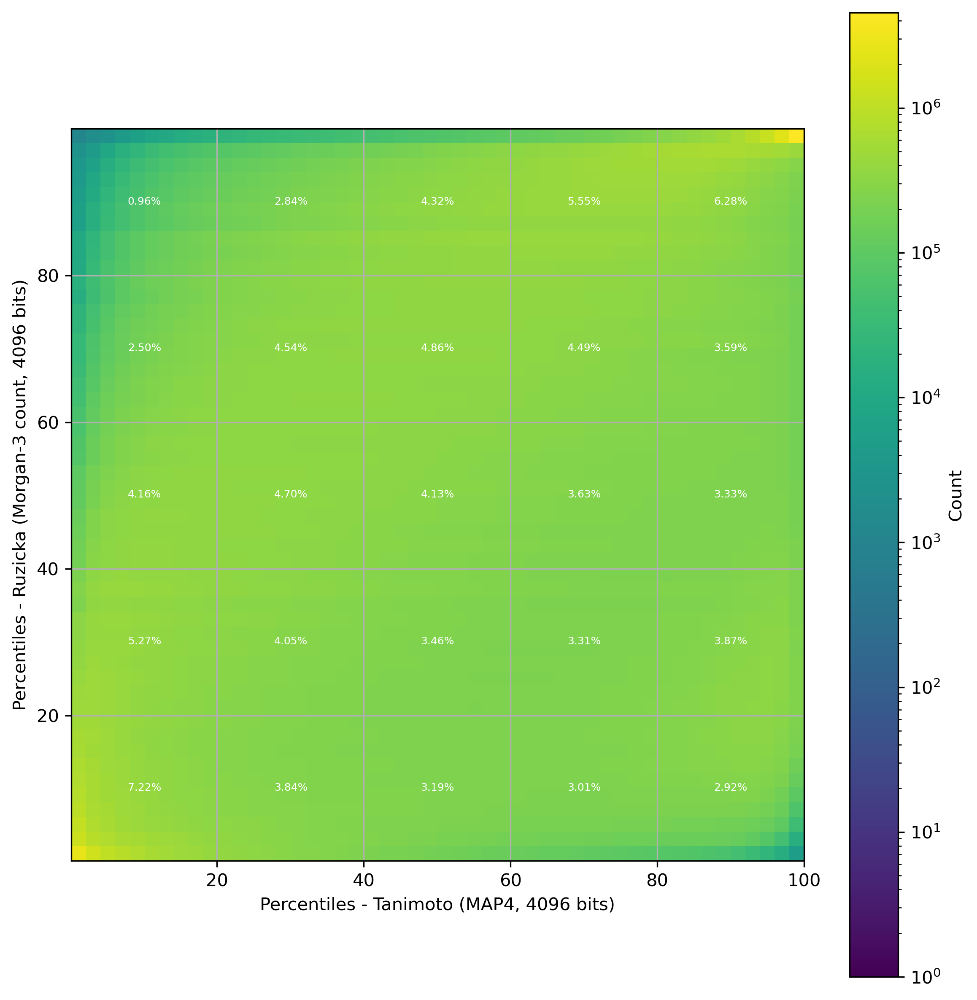

In [61]:
NBITS = 4096

heatmap_comparison(
    scaled_similarities_map4,
    scaled_similarities_morgan3_count,
    f"Percentiles - Tanimoto (MAP4, {NBITS} bits)",
    f"Percentiles - Ruzicka (Morgan-3 count, {NBITS} bits)",
    bins=50,
    #colormap="inferno",
    filename="heatmap_scaled_tanimoto_map4_vs_scaled_ruzicka_morgan3.png"
)

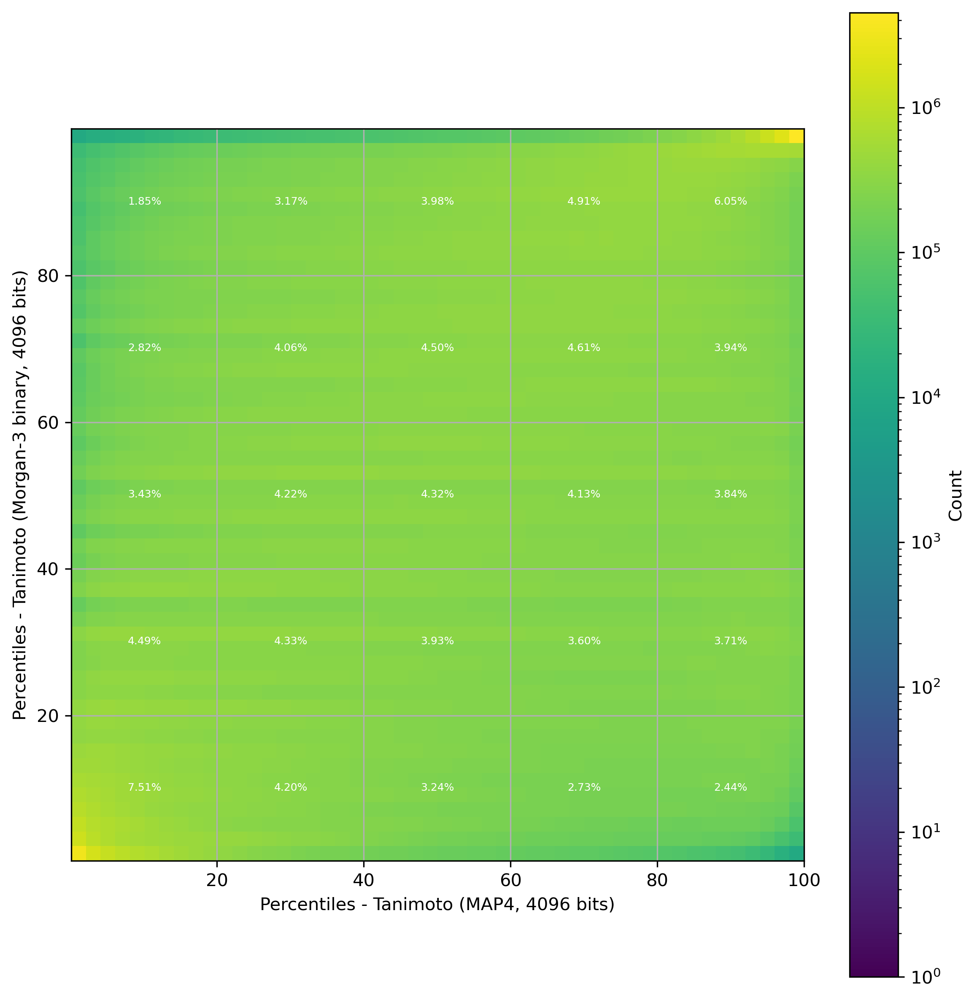

In [62]:
NBITS = 4096

heatmap_comparison(
    scaled_similarities_map4,
    scaled_similarities_morgan3,
    f"Percentiles - Tanimoto (MAP4, {NBITS} bits)",
    f"Percentiles - Tanimoto (Morgan-3 binary, {NBITS} bits)",
    bins=50,
    #colormap="inferno",
    filename="heatmap_scaled_tanimoto_map4_vs_scaled_tanimoto_morgan3.png"
)

## Compare score distributions for small and larger molecules

8578 8525


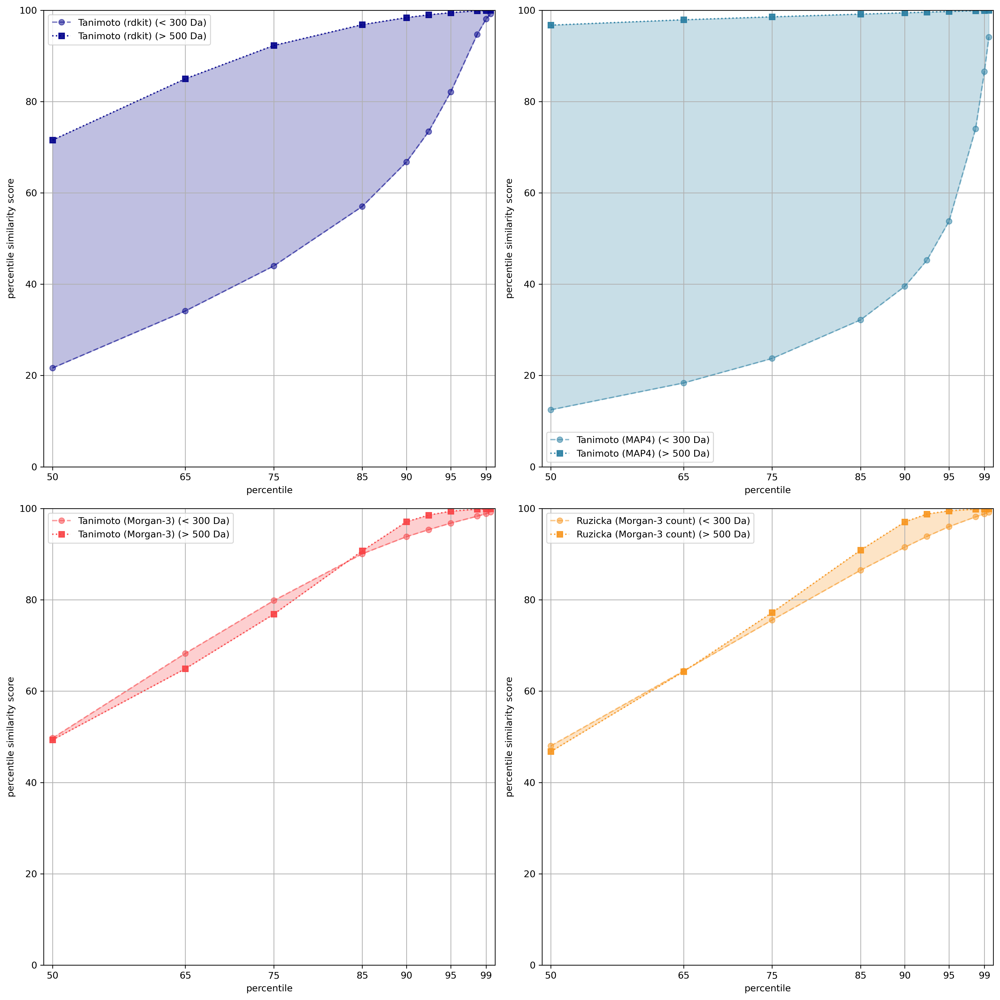

In [74]:
#percentiles = np.arange(0, 101)
percentiles = [50, 65, 75, 85, 90, 92.5, 95, 98, 99, 99.5] #, 99.9]
percentiles_ticks = [50, 65, 75, 85, 90, 95, 99]

mass_low = 300
mass_high = 500

idx1 = np.where(compounds.mass[indices_selected] > mass_high)[0]
idx0 = np.where(compounds.mass[indices_selected] < mass_low)[0]
print(idx0.shape[0], idx1.shape[0])

similarities_dict = {
    "Tanimoto (rdkit)": scaled_similarities_rdkit,
    "Tanimoto (MAP4)": scaled_similarities_map4,
    "Tanimoto (Morgan-3)": scaled_similarities_morgan3,
    #"Ruzicka (Morgan-2 count, 4096 bits)": similarities_morgan2_count,
    "Ruzicka (Morgan-3 count)": scaled_similarities_morgan3_count,
    #"Ruzicka (Morgan-6 count)": sscaled_imilarities_morgan6_count,
    #"Ruzicka (Morgan-9 count)": scaled_similarities_morgan9_count,
}

# Compare selected percentiles
fig, axes = plt.subplots(2, 2, figsize=(15, 15), dpi=300)


#colors = ["darkblue", "dodgerblue", "teal", "darkred", "crimson", "orange"]
colors = ["darkblue", "#277DA1", #"#4D908E", 
          "#F94144", "#F8961E", "#F9C74F"]

curves =  {key: {} for key, _ in similarities_dict.items()}

coords = [(0, 0), (0, 1), #(0, 2),
          (1, 0), (1, 1), #(1, 2)
         ]
x_low = 49
x_high = 100
y_low = 0
y_high = 100

for i, (key, similarities) in enumerate(similarities_dict.items()):
    percentile_scores = np.percentile(similarities[np.ix_(idx0, idx0)].reshape(-1), percentiles)
    curves[key][mass_low] = percentile_scores
    axes[coords[i]].plot(percentiles, percentile_scores, ".--", markersize=12, label=key+f" (< {mass_low} Da)", color=colors[i], alpha=0.5)

    percentile_scores = np.percentile(similarities[np.ix_(idx1, idx1)].reshape(-1), percentiles)
    curves[key][mass_high] = percentile_scores
    axes[coords[i]].plot(percentiles, percentile_scores, "s:", markersize=6, label=key+f" (> {mass_high} Da)", color=colors[i],  alpha=0.9)

for i, (key, similarities) in enumerate(similarities_dict.items()):
    axes[coords[i]].fill_between(percentiles, curves[key][mass_low], curves[key][mass_high], color=colors[i], alpha=0.25)
    
    axes[coords[i]].set_xticks(percentiles_ticks, [str(x) for x in percentiles_ticks])
    axes[coords[i]].grid(True)
    axes[coords[i]].set_xlabel("percentile")
    axes[coords[i]].set_ylabel("percentile similarity score")
    axes[coords[i]].set_ylim(y_low, y_high)
    axes[coords[i]].set_xlim(x_low, x_high)
    axes[coords[i]].legend()

plt.tight_layout()
plt.savefig("fig_low_high_mass_score_percentiles_scaled.pdf")
plt.savefig("fig_low_high_mass_score_percentiles_scaled.png", dpi=400)
plt.show()

In [98]:
from matplotlib.colors import LogNorm
import numpy as np
import matplotlib.pyplot as plt

def heatmap_comparison(similarities1, similarities2, label1, label2, bins=50,
                       colormap="viridis",
                       ignore_diagonal=True,
                       filename=None):
    fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
    
    # Compute the 2D histogram
    if ignore_diagonal:
        iu1 = np.triu_indices(similarities1.shape[0], k=1)
    else:
        iu1 = np.triu_indices(similarities1.shape[0], k=0)

    hist, x_edges, y_edges = np.histogram2d(
        similarities1[iu1], 
        similarities2[iu1], 
        bins=bins
    )
    
    # Display the heatmap using imshow with logarithmic color scale
    im = ax.imshow(hist.T, origin='lower', aspect='equal',
                   extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
                   cmap=colormap, norm=LogNorm(vmin=1, vmax=np.max(hist)))
    
    # Add colorbar with proper tick formatting
    cb = fig.colorbar(im, ax=ax)
    cb.set_label('Count')

    total_sum = iu1[0].shape[0]

    # Add text annotations for each 5x5 square
    step = bins // 5
    for i in range(0, bins, step):
        for j in range(0, bins, step):
            # Compute the sum of the elements in the 5x5 square
            sub_matrix = hist[i:i+step, j:j+step]
            subsection_sum = np.sum(sub_matrix)
            
            # Compute the center of the square for placing the text
            x_center = (x_edges[i] + x_edges[i + step]) / 2
            y_center = (y_edges[j] + y_edges[j + step]) / 2
            
            # Add the text to the plot
            if subsection_sum > 0:
                ax.text(x_center, y_center, f"{(100 * subsection_sum / total_sum):.2f}%", color="white", 
                        ha="center", va="center", fontsize=6, zorder=2)
    
    # Add grid and labels
    ax.grid(True, zorder=1)
    ax.set_xlabel(label1)
    ax.set_ylabel(label2)
    
    plt.tight_layout()
    if filename is not None:
        plt.savefig(filename)
    plt.show()

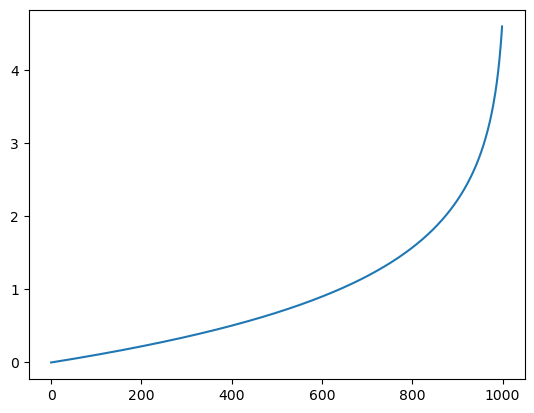

In [10]:
percentiles = np.linspace(0, 99.99, 1000)

def percentile_scaling(percentiles, epsilon=0.01):
    return - np.log((1 + epsilon) - percentiles/100)
    #return (percentiles/100) ** 3

scaled = percentile_scaling(percentiles)
plt.plot(scaled)

In [7]:
from visualizations import heatmap_comparison_scaled_bins

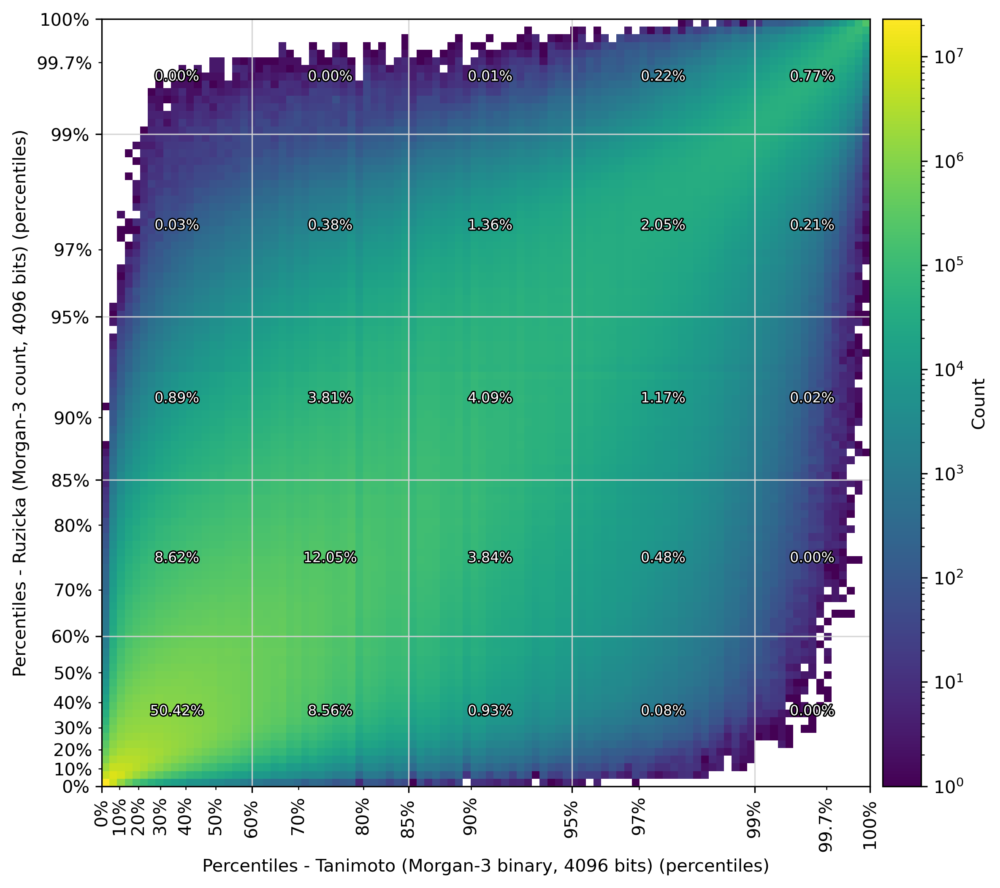

In [30]:
NBITS = 4096

heatmap_comparison_scaled_bins(
    scaled_similarities_morgan3,
    scaled_similarities_morgan3_count,
    f"Percentiles - Tanimoto (Morgan-3 binary, {NBITS} bits)",
    f"Percentiles - Ruzicka (Morgan-3 count, {NBITS} bits)",
    bins=100,
    #colormap="inferno",
    filename="heatmap_neg_log_tanimoto_morgan3_vs_ruzicka_morgan3.png"
)

In [73]:
def select_pairs_from_ids(idx, n_pairs=10):
    pairs = list(zip(idx[0], idx[1]))
    
    # Step 1: Sort each pair so that (smaller, larger)
    sorted_pairs = {(min(a, b), max(a, b)) for a, b in pairs}
    
    # Step 2: Convert to a sorted list of unique pairs
    unique_pairs = list(sorted_pairs)
    
    # Step 3: Select only one per first ID
    selected_pairs = {}
    for a, b in unique_pairs:
        if a not in selected_pairs:
            selected_pairs[a] = (a, b)
        else:
            # Randomly decide whether to replace existing pair
            if random.random() > 0.5:
                selected_pairs[a] = (a, b)
    
    # Convert dictionary values back to a list
    final_pairs = list(selected_pairs.values())
    if len(final_pairs) < n_pairs:
        n_pairs = len(final_pairs)
    select_ids = np.random.choice(np.arange(len(final_pairs)), n_pairs, replace=False)
    return [final_pairs[i] for i in select_ids]


from rdkit import Chem
from rdkit.Chem import Draw


def show_pairs_in_grid(unique_pairs, ncols=2, figsize=(30, 18), filename=None):
    nrows = -(-len(unique_pairs) // ncols)  # Ceiling division to get number of rows
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    axes = axes.flatten()  # Flatten to iterate easily

    for i, pair in enumerate(unique_pairs):
        id1, id2 = pair
        ax = axes[i]
        
        # Get SMILES and render molecules
        smiles1 = compounds.smiles[id1]
        smiles2 = compounds.smiles[id2]
        mol1 = Chem.MolFromSmiles(smiles1)
        mol2 = Chem.MolFromSmiles(smiles2)
        img = Draw.MolsToGridImage([mol1, mol2], molsPerRow=2, subImgSize=(800, 800), returnPNG=False)
        
        ax.imshow(img)
        ax.axis('off')
        
        # Get and display score summary below the molecules
        scores = get_score_summary(id1, id2)
        ax.set_title(f"Pair {i + 1}")
        ax.text(0.5, 0, scores, #.to_string(header=False), 
                transform=ax.transAxes, ha='center', fontsize=10, family='monospace')
    
    # Hide any unused subplots if number of pairs is less than grid size
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    if filename is not None:
        plt.savefig(filename)
    plt.show()


In [65]:
def get_score_summary(id1, id2):
    output = f"Scaled Tanimoto (Morgan-3 binary): {scaled_similarities_morgan3[id1, id2]:.4f}" \
    + f"(actual score: {similarities_morgan3[id1, id2]:.4f})\n"\
    + f"Scaled Ruzicka (Morgan-3 count fp): {scaled_similarities_morgan3_count[id1, id2]:.4f}"\
    + f"(actual score: {similarities_morgan3_count[id1, id2]:.4f})\n"
    return output

In [94]:
idx = np.where((scaled_similarities_morgan3_count > 99.7) \
               & (scaled_similarities_morgan3 < 90) \
              )
idx[0].shape

(218,)

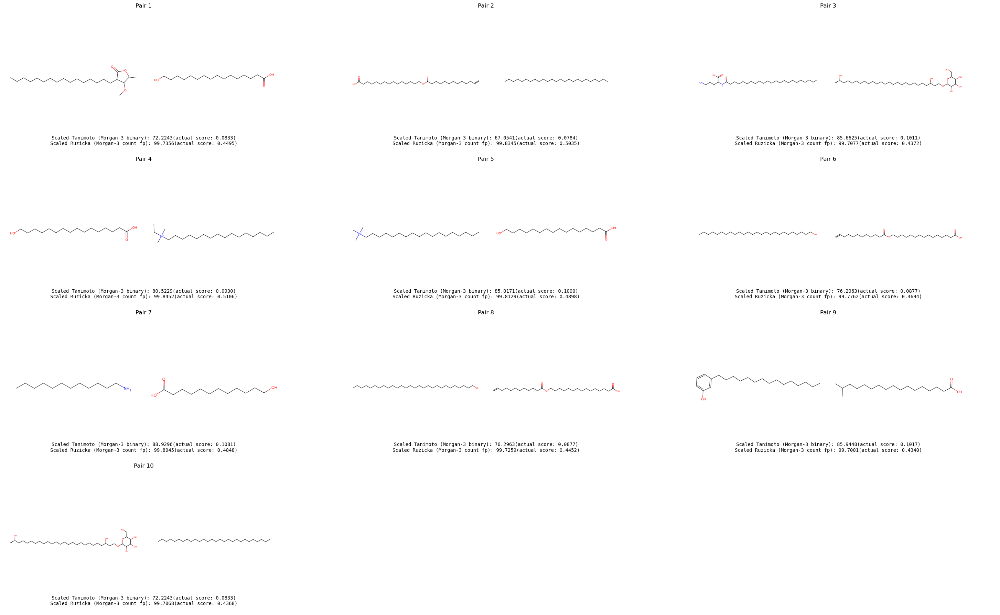

In [96]:
show_pairs_in_grid(select_pairs_from_ids(idx, 10), 3,
                   filename="examples_morgan3_count_vs_binary_01.png"
                  )

In [151]:
idx = np.where((scaled_similarities_morgan3_count > 99.8) \
               & (scaled_similarities_morgan3 < 95) \
              )
idx[0].shape

(126,)

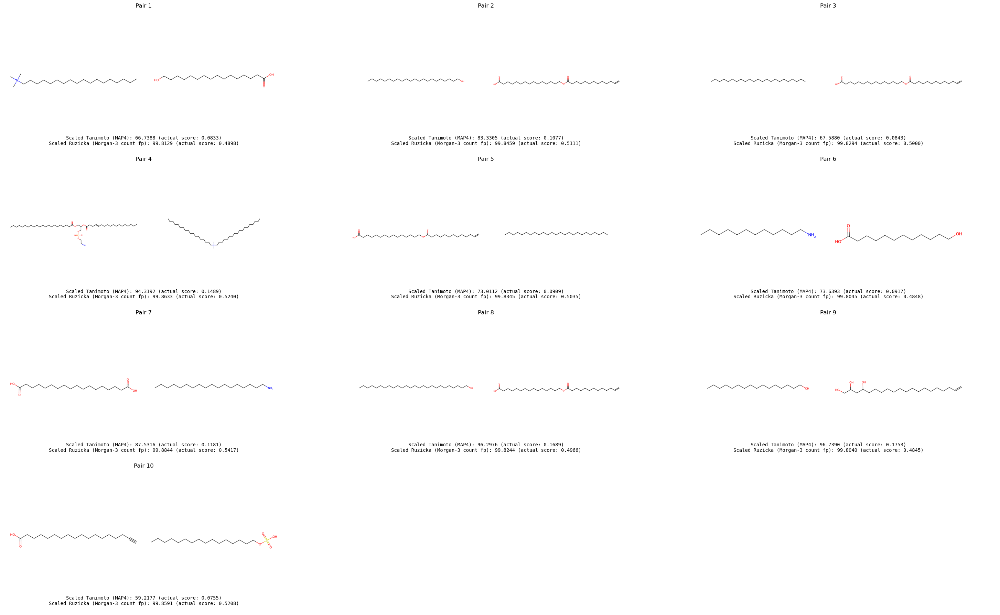

In [152]:
show_pairs_in_grid(select_pairs_from_ids(idx, 10), 3,
                   filename="examples_morgan3_count_vs_binary_03.png"
                  )

In [97]:
idx = np.where((scaled_similarities_morgan3_count < 90) \
               & (scaled_similarities_morgan3 > 99.9) \
              )
idx[0].shape

(28,)

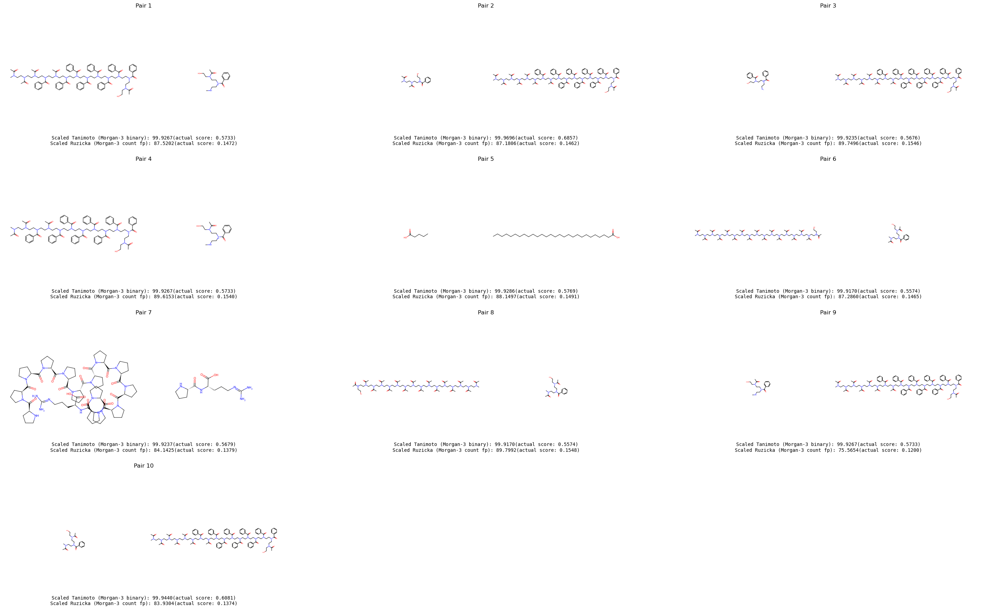

In [98]:
show_pairs_in_grid(select_pairs_from_ids(idx, 10), 3,
                   filename="examples_morgan3_count_vs_binary_02.png"
                  )

# Tanimoto rdkit vs Morgan3

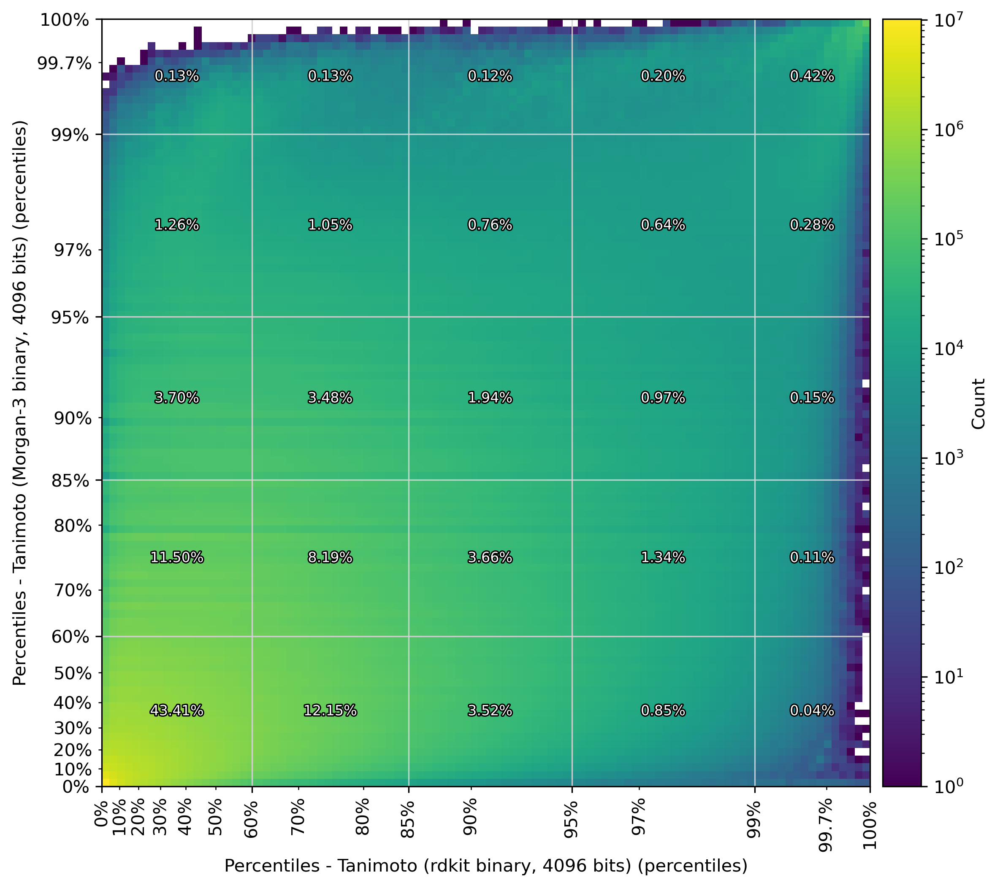

In [31]:
NBITS = 4096

heatmap_comparison_scaled_bins(
    scaled_similarities_rdkit,
    scaled_similarities_morgan3,
    f"Percentiles - Tanimoto (rdkit binary, {NBITS} bits)",
    f"Percentiles - Tanimoto (Morgan-3 binary, {NBITS} bits)",
    bins=100,
    #colormap="inferno",
    filename="heatmap_neg_log_tanimoto_rdkit_vs_tanimoto_morgan3.png"
)

In [99]:
def get_score_summary(id1, id2):
    output = f"Scaled Tanimoto (Morgan-3 binary): {scaled_similarities_morgan3[id1, id2]:.4f}" \
    + f"(actual score: {similarities_morgan3[id1, id2]:.4f})\n"\
    + f"Scaled Tanimoto (rdkit): {scaled_similarities_rdkit[id1, id2]:.4f}"\
    + f"(actual score: {similarities_rdkit[id1, id2]:.4f})\n"
    return output

In [108]:
idx = np.where((scaled_similarities_rdkit < 80) \
               & (scaled_similarities_morgan3 > 99.9) \
              )
idx[0].shape

(70,)

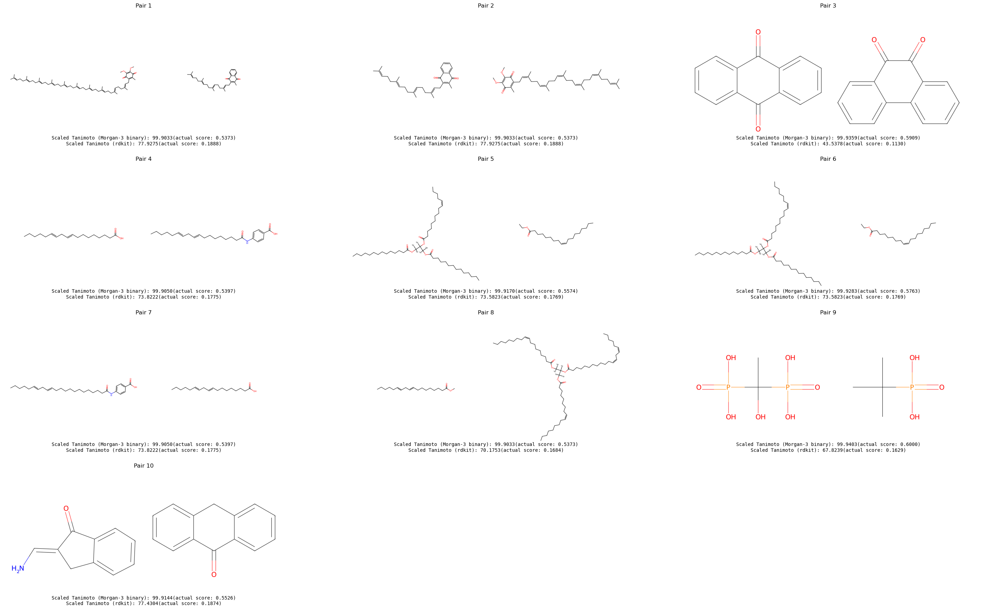

In [109]:
show_pairs_in_grid(select_pairs_from_ids(idx, 10), 3,
                   filename="examples_tanimoto_morgan3_vs_rdkit_01.png"
                  )

In [110]:
idx = np.where((scaled_similarities_rdkit > 99.9) \
               & (scaled_similarities_morgan3 < 60) \
              )
idx[0].shape

(684,)

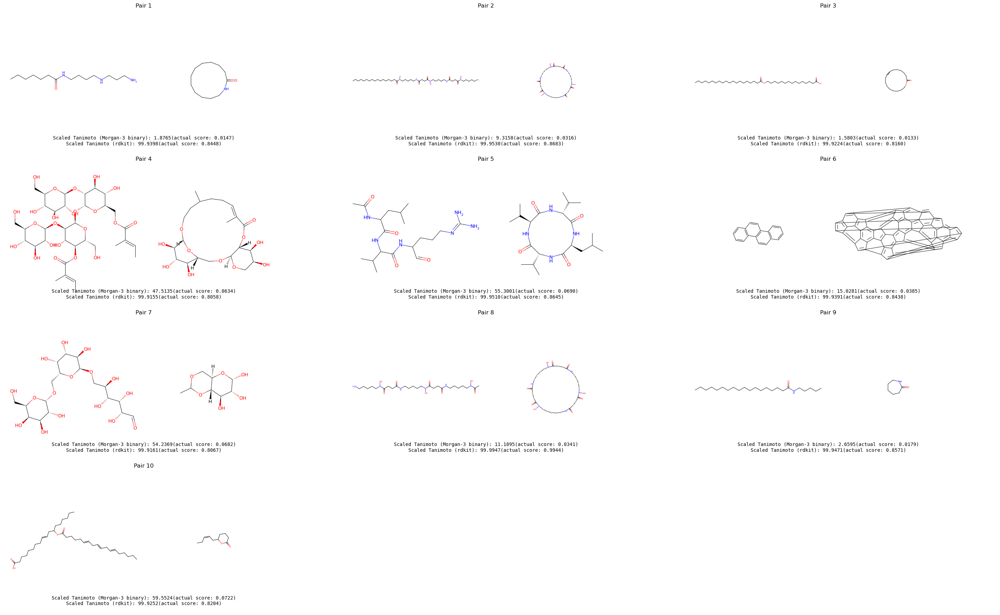

In [111]:
show_pairs_in_grid(select_pairs_from_ids(idx, 10), 3,
                   filename="examples_tanimoto_morgan3_vs_rdkit_02.png"
                  )

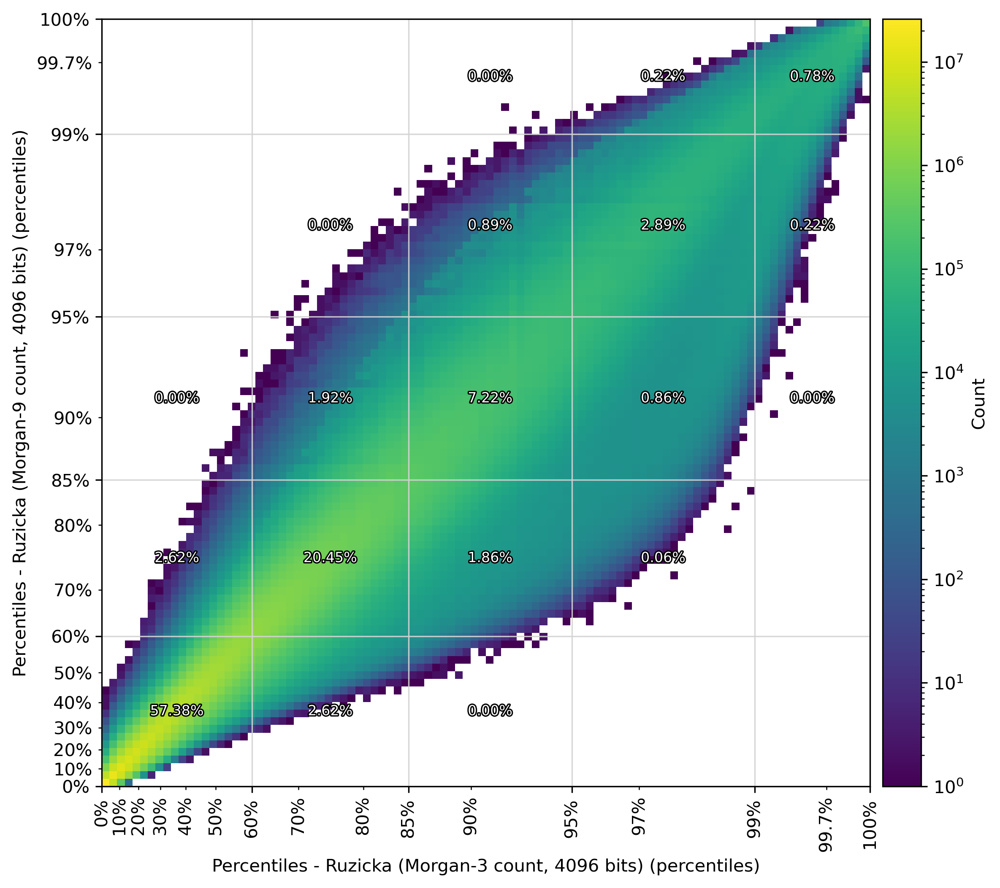

In [33]:
NBITS = 4096

heatmap_comparison_scaled_bins(
    scaled_similarities_morgan3_count,
    scaled_similarities_morgan9_count,
    f"Percentiles - Ruzicka (Morgan-3 count, {NBITS} bits)",
    f"Percentiles - Ruzicka (Morgan-9 count, {NBITS} bits)",
    bins=100,
    #colormap="inferno",
    filename="heatmap_neg_log_ruzicka_morgan9_vs_morgan3.png"
)

# MAP4 vs morgan count

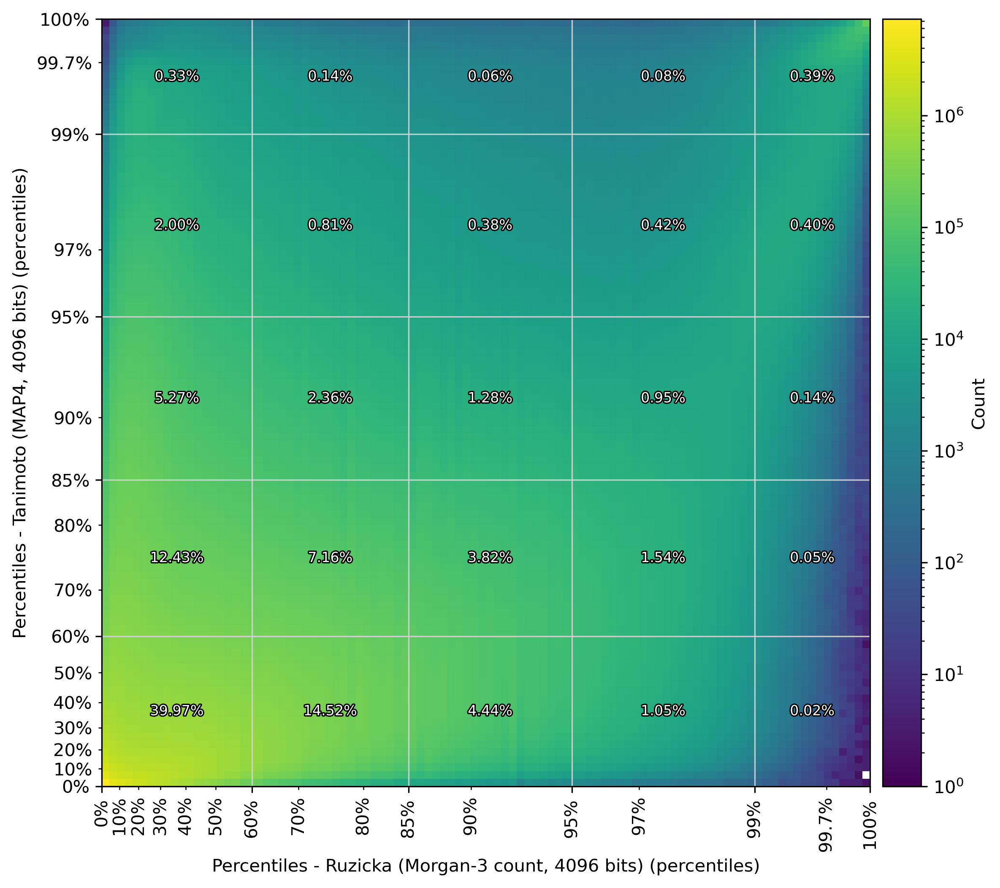

In [32]:
NBITS = 4096

heatmap_comparison_scaled_bins(
    scaled_similarities_morgan3_count,
    scaled_similarities_map4,
    f"Percentiles - Ruzicka (Morgan-3 count, {NBITS} bits)",
    f"Percentiles - Tanimoto (MAP4, {NBITS} bits)",
    bins=100,
    #colormap="inferno",
    filename="heatmap_neg_log_tanimoto_map4_vs_tanimoto_morgan3.png"
)

In [127]:
def get_score_summary(id1, id2):
    output = f"Scaled Tanimoto (MAP4): {scaled_similarities_map4[id1, id2]:.4f}" \
    + f" (actual score: {similarities_map4[id1, id2]:.4f})\n"\
    + f"Scaled Ruzicka (Morgan-3 count fp): {scaled_similarities_morgan3_count[id1, id2]:.4f}"\
    + f" (actual score: {similarities_morgan3_count[id1, id2]:.4f})\n"
    return output

In [122]:
idx = np.where((scaled_similarities_map4 > 99.95) \
               & (scaled_similarities_morgan3_count < 30) \
              )
idx[0].shape

(10834,)

In [136]:
idx = np.where((scaled_similarities_map4 > 99.995) \
               & (scaled_similarities_morgan3_count < 50) \
              )
idx[0].shape

(2566,)

In [128]:
# this is only the diagonal -- so ignore
#idx = np.where((scaled_similarities_map4 == 0) \
#               & (scaled_similarities_morgan3_count == 0) \
              )
#idx[0].shape

(37663,)

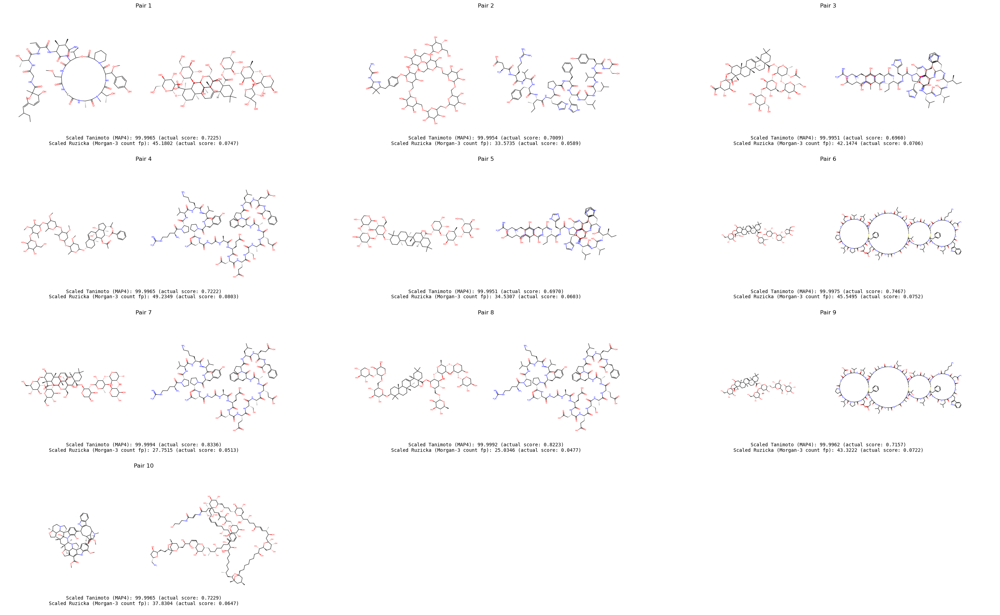

In [138]:
show_pairs_in_grid(select_pairs_from_ids(idx, 10), 3,
                   filename="examples_tmap4_vs_morgan3_count_01.png"
                  )

In [140]:
idx = np.where((scaled_similarities_map4 < 50) \
               & (scaled_similarities_morgan3_count > 99.9) \
              )
idx[0].shape

(366,)

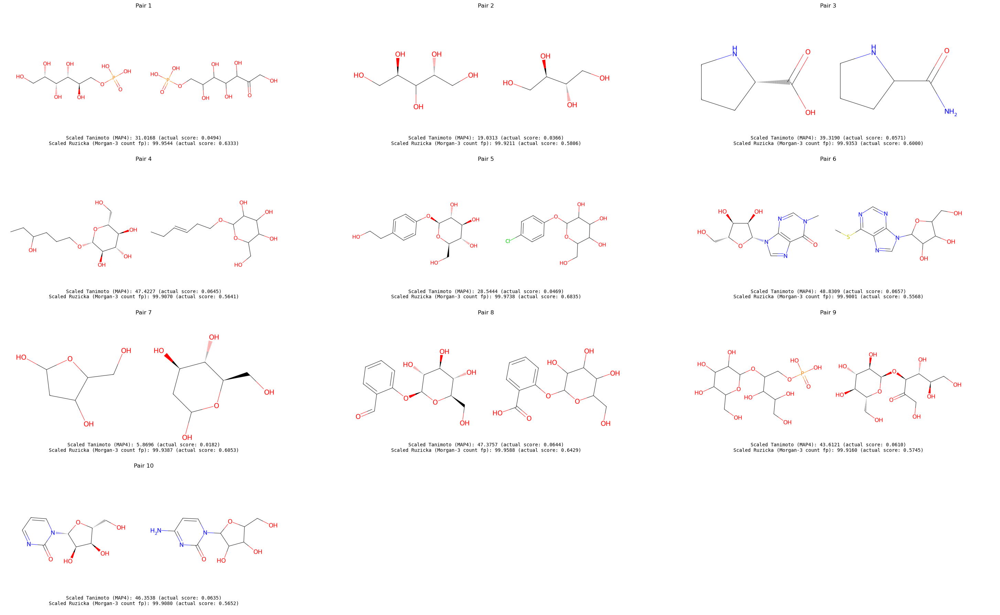

In [141]:
show_pairs_in_grid(select_pairs_from_ids(idx, 10), 3,
                   filename="examples_tmap4_vs_morgan3_count_02.png"
                  )

In [145]:
for pair in select_pairs_from_ids(idx, 3):
    print(f"{compounds.smiles[pair[0]]} --- vs --- {compounds.smiles[pair[1]]}")

CC(=O)c1c(O)cc(O[C@@H]2O[C@H](CO)[C@@H](O)[C@H](O)[C@H]2O)cc1O --- vs --- OC=1C=C(OC2OC(CO)C(O)C(O)C2O)C=C(C1)C
C1[C@H]([C@@H]([C@@H](C=C1C(=O)O)O)O)O --- vs --- COC(=O)C1=CC(O)C(O)C(O)C1
OC[C@H]1O[C@@H](OCCc2ccc(O)cc2)[C@H](O)[C@@H](O)[C@@H]1O --- vs --- OCC1OC(OCCC=2C=CC=CC2)C(O)C(O)C1O


In [146]:
idx = np.where((scaled_similarities_map4 < 80) \
               & (scaled_similarities_morgan3_count > 99.99) \
              )
idx[0].shape

(46,)

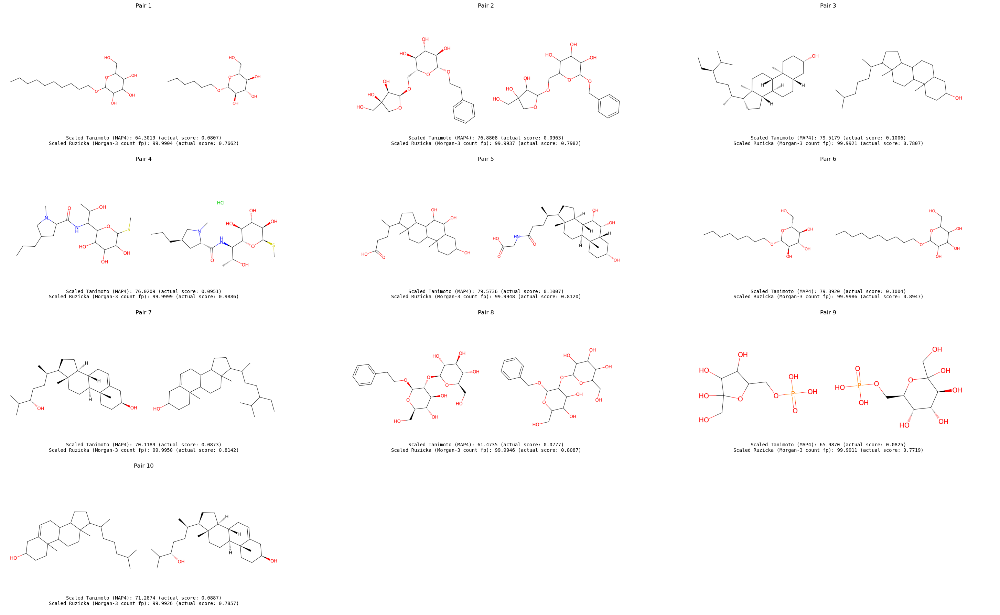

In [148]:
show_pairs_in_grid(select_pairs_from_ids(idx, 10), 3,
                   filename="examples_tmap4_vs_morgan3_count_03.png"
                  )

8578 8525


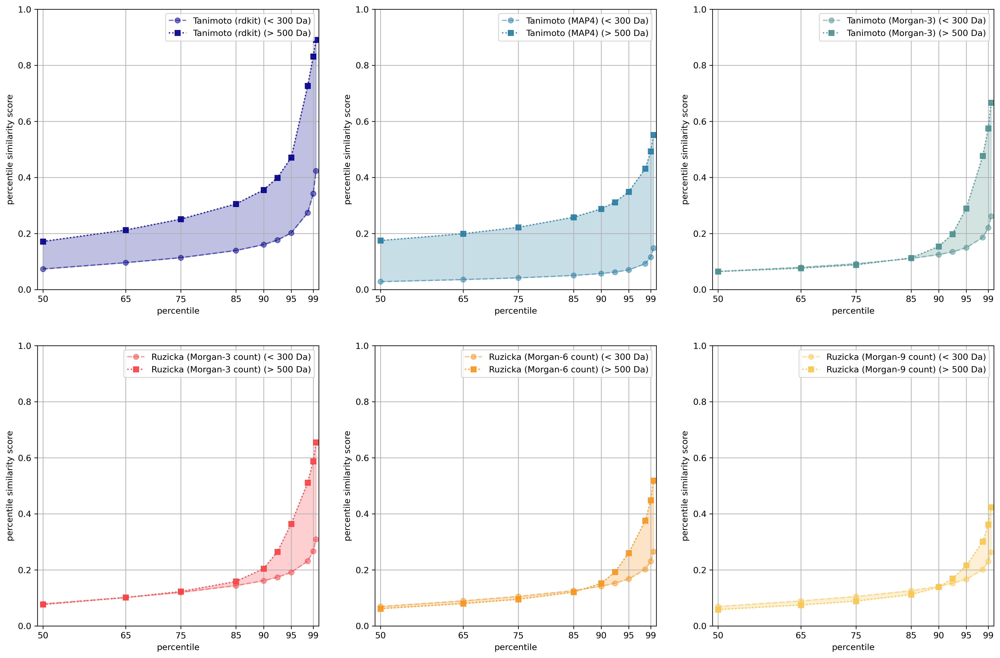

In [54]:
#percentiles = np.arange(0, 101)
percentiles = [50, 65, 75, 85, 90, 92.5, 95, 98, 99, 99.5] #, 99.9]
percentiles_ticks = [50, 65, 75, 85, 90, 95, 99]

mass_low = 300
mass_high = 500

idx1 = np.where(compounds.mass[indices_selected] > mass_high)[0]
idx0 = np.where(compounds.mass[indices_selected] < mass_low)[0]
print(idx0.shape[0], idx1.shape[0])

similarities_dict = {
    "Tanimoto (rdkit)": similarities_rdkit,
    "Tanimoto (MAP4)": similarities_map4,
    "Tanimoto (Morgan-3)": similarities_morgan3,
    #"Ruzicka (Morgan-2 count, 4096 bits)": similarities_morgan2_count,
    "Ruzicka (Morgan-3 count)": similarities_morgan3_count,
    "Ruzicka (Morgan-6 count)": similarities_morgan6_count,
    "Ruzicka (Morgan-9 count)": similarities_morgan9_count,
}

# Compare selected percentiles
fig, axes = plt.subplots(2, 3, figsize=(20, 13), dpi=300)


#colors = ["darkblue", "dodgerblue", "teal", "darkred", "crimson", "orange"]
colors = ["darkblue", "#277DA1", "#4D908E", "#F94144", "#F8961E", "#F9C74F"]

curves =  {key: {} for key, _ in similarities_dict.items()}

coords = [(0, 0), (0, 1), (0, 2), (1, 0), (1, 1), (1, 2)]

for i, (key, similarities) in enumerate(similarities_dict.items()):
    percentile_scores = np.percentile(similarities[np.ix_(idx0, idx0)].reshape(-1), percentiles)
    curves[key][mass_low] = percentile_scores
    axes[coords[i]].plot(percentiles, percentile_scores, ".--", markersize=12, label=key+f" (< {mass_low} Da)", color=colors[i], alpha=0.5)

    percentile_scores = np.percentile(similarities[np.ix_(idx1, idx1)].reshape(-1), percentiles)
    curves[key][mass_high] = percentile_scores
    axes[coords[i]].plot(percentiles, percentile_scores, "s:", markersize=6, label=key+f" (> {mass_high} Da)", color=colors[i],  alpha=0.9)

for i, (key, similarities) in enumerate(similarities_dict.items()):
    axes[coords[i]].fill_between(percentiles, curves[key][mass_low], curves[key][mass_high], color=colors[i], alpha=0.25)

    axes[coords[i]].set_xticks(percentiles_ticks, [str(x) for x in percentiles_ticks])
    axes[coords[i]].grid(True)
    axes[coords[i]].set_xlabel("percentile")
    axes[coords[i]].set_ylabel("percentile similarity score")
    axes[coords[i]].set_ylim(0, 1)
    axes[coords[i]].set_xlim(49, 100)
    axes[coords[i]].legend()

plt.tight_layout()
plt.savefig("fig_low_high_mass_score_percentiles.pdf")
plt.savefig("fig_low_high_mass_score_percentiles.png", dpi=400)
plt.show()

# Score vs Score comparisons

This was previously done using hexbin plots, which look nice, but fail for too large data due to matplotlib caused memory inefficiency (required > 120GB RAM).

So now using heatmap plots.

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

def heatmap_comparison(similarities1, similarities2, label1, label2, bins=100, filename=None):
    fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
    
    # Compute the 2D histogram
    hist, x_edges, y_edges = np.histogram2d(
        similarities1.ravel(), 
        similarities2.ravel(), 
        bins=bins
    )
    
    # Display the heatmap using imshow with logarithmic color scale
    im = ax.imshow(hist.T, origin='lower', aspect='equal',
                   extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
                   cmap='viridis', norm=LogNorm(vmin=1, vmax=np.max(hist)))
    
    # Add colorbar with proper tick formatting
    cb = fig.colorbar(im, ax=ax)
    #tick_values = np.logspace(0, np.log10(np.max(hist)), num=10)
    #cb.set_ticks(tick_values)
    #cb.set_ticklabels([f"{int(t):,}" for t in tick_values])  # Rounded integer labels
    cb.set_label('Count')
    
    # Add grid and labels
    ax.grid(True, zorder=1)
    ax.set_xlabel(label1)
    ax.set_ylabel(label2)
    
    plt.tight_layout()
    if filename is not None:
        plt.savefig(filename)
    plt.show()


## Tanimoto (rdkit) vs Tanimoto (Morgan-3)

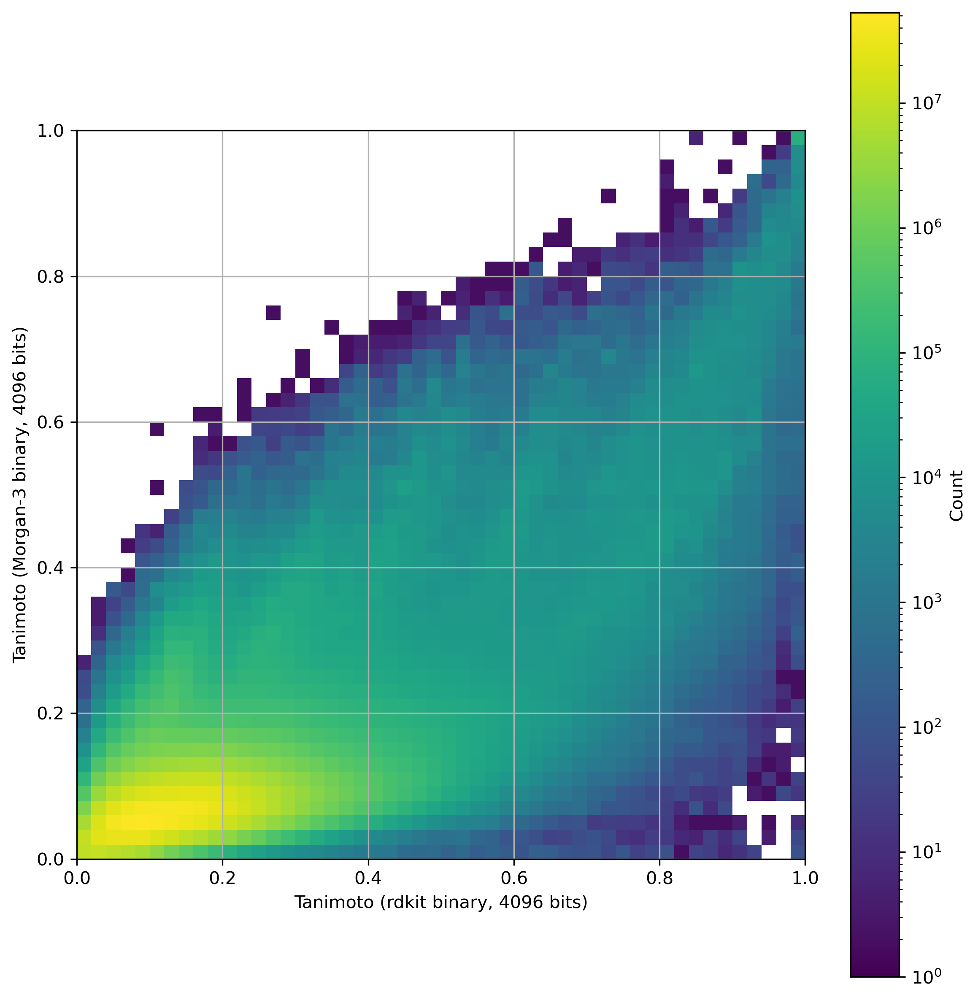

In [64]:
heatmap_comparison(
    similarities_rdkit,
    similarities_morgan3,
    f"Tanimoto (rdkit binary, {NBITS} bits)",
    f"Tanimoto (Morgan-3 binary, {NBITS} bits)",
    bins=50,
    filename="heatmap_tanimoto_rdkit_vs_tanimoto_morgan3.png"
)

## Tanimoto (rdkit) vs Ruzicka (Morgan-3)

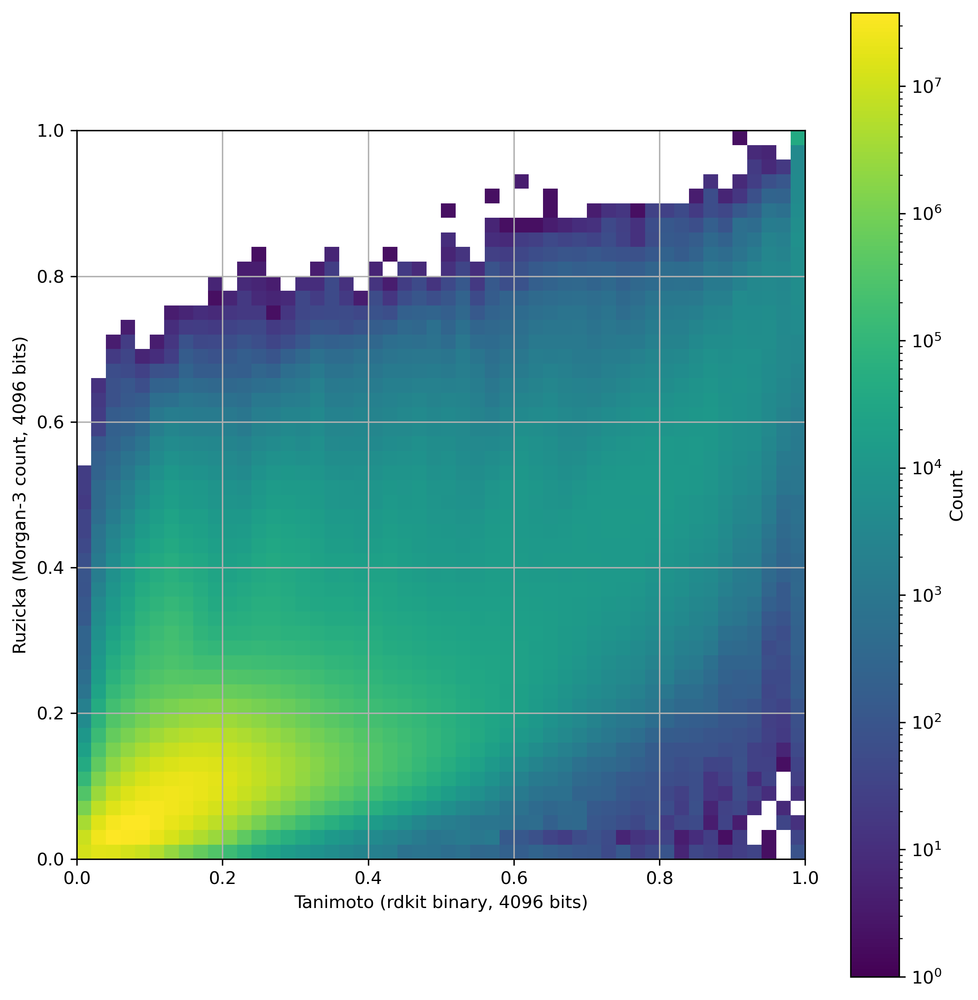

In [55]:
heatmap_comparison(
    similarities_rdkit,
    similarities_morgan3_count,
    f"Tanimoto (rdkit binary, {NBITS} bits)",
    f"Ruzicka (Morgan-3 count, {NBITS} bits)",
    bins=50,
    filename="heatmap_tanimoto_rdkit_vs_ruzicka_morgan3.png"
)

## Tanimoto (Morgan-3) vs Ruzicka (Morgan-3)

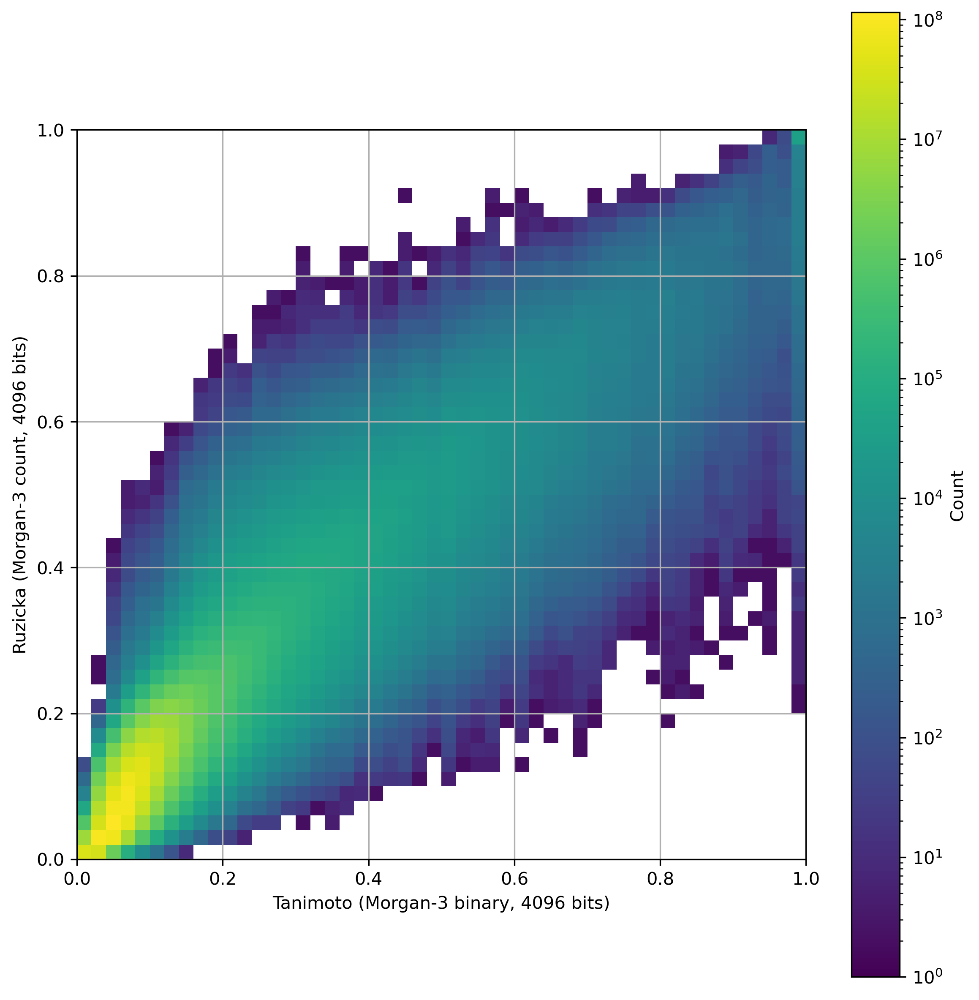

In [72]:
heatmap_comparison(
    similarities_morgan3,
    similarities_morgan3_count,
    f"Tanimoto (Morgan-3 binary, {NBITS} bits)",
    f"Ruzicka (Morgan-3 count, {NBITS} bits)",
    bins=50,
    filename="heatmap_tanimoto_morgan3_vs_ruzicka_morgan3.png"
)

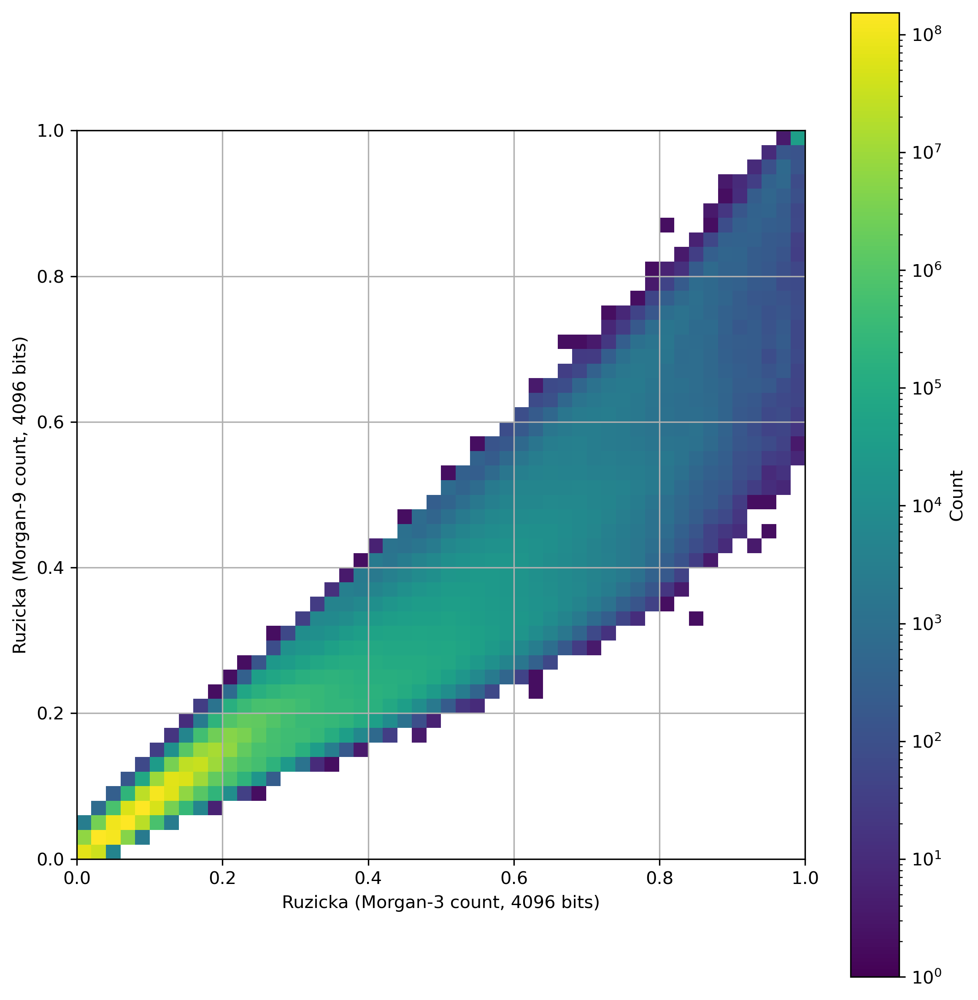

In [74]:
heatmap_comparison(
    similarities_morgan3_count,
    similarities_morgan9_count,
    f"Ruzicka (Morgan-3 count, {NBITS} bits)",
    f"Ruzicka (Morgan-9 count, {NBITS} bits)",
    bins=50,
    filename="heatmap_ruzicka_morgan3_vs_ruzicka_morgan9.png"
)

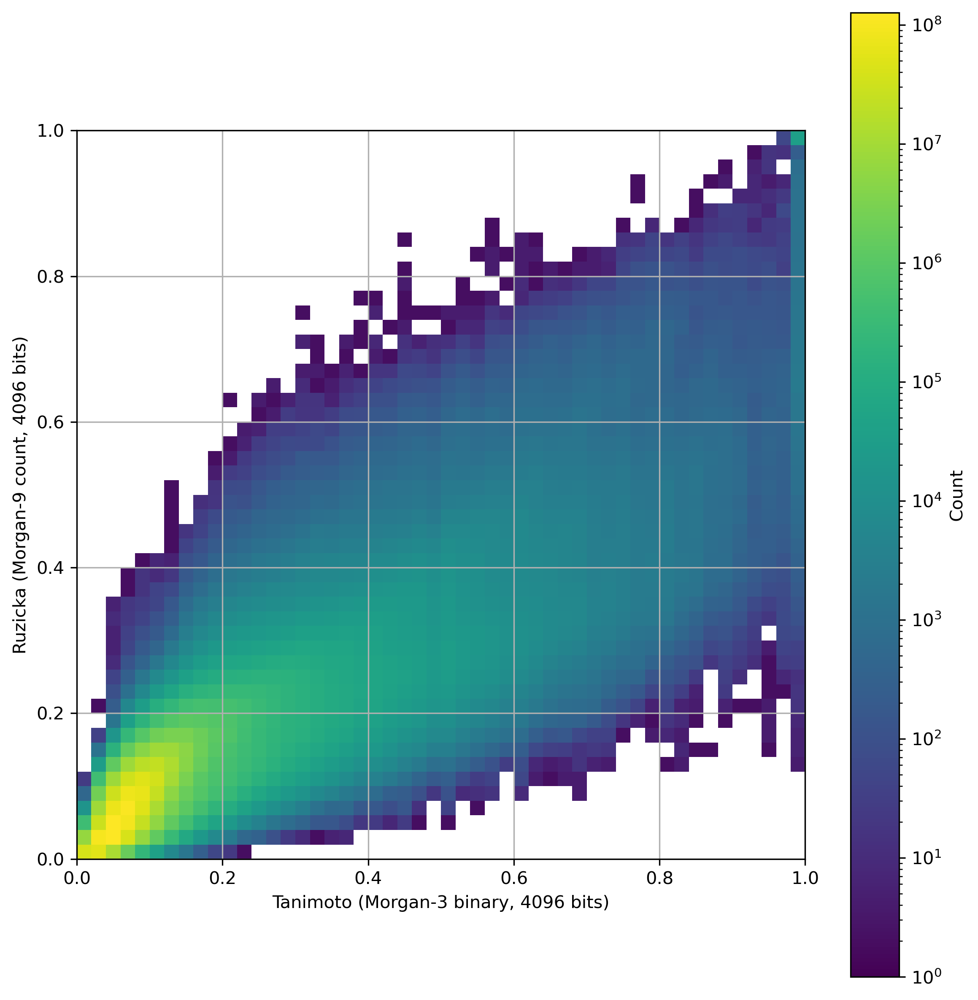

In [75]:
heatmap_comparison(
    similarities_morgan3,
    similarities_morgan9_count,
    f"Tanimoto (Morgan-3 binary, {NBITS} bits)",
    f"Ruzicka (Morgan-9 count, {NBITS} bits)",
    bins=50,
    filename="heatmap_tanimoto_morgan3_vs_ruzicka_morgan9.png"
)

## Compare to MAP4

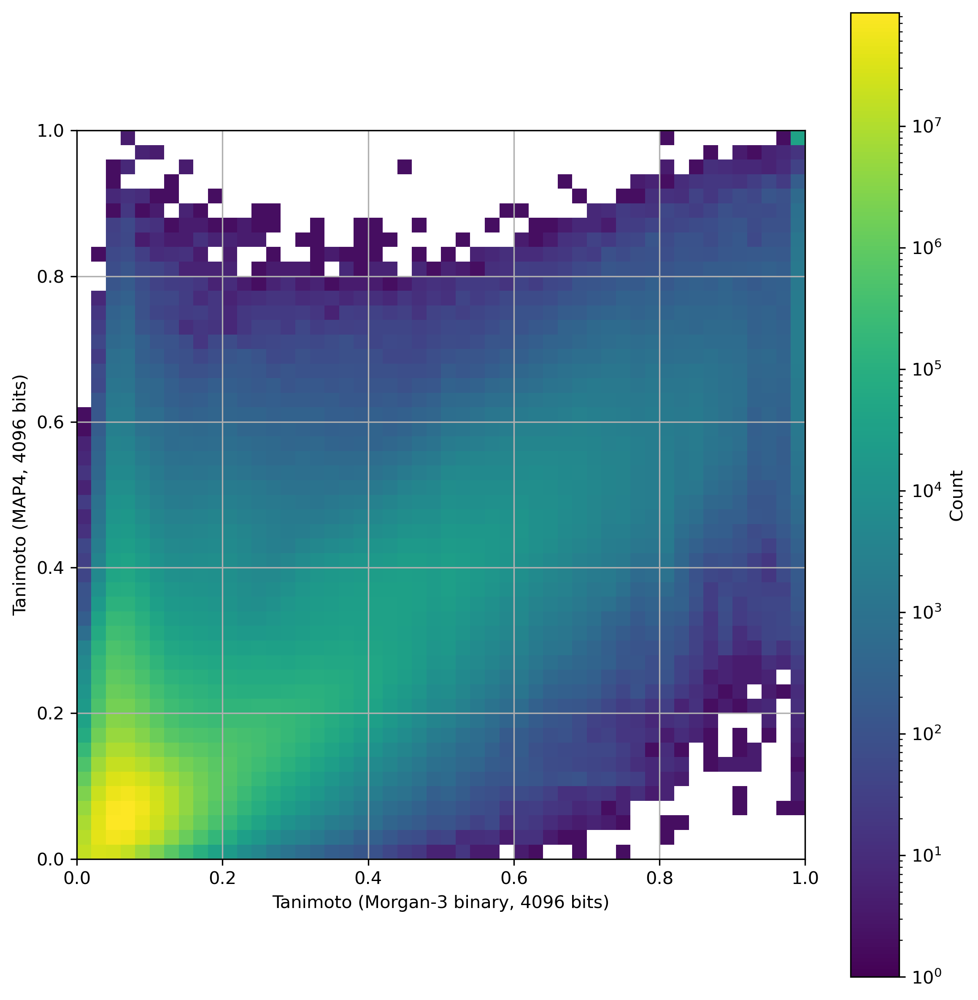

In [81]:
heatmap_comparison(
    similarities_morgan3,
    similarities_map4,
    f"Tanimoto (Morgan-3 binary, {NBITS} bits)",
    f"Tanimoto (MAP4, {NBITS} bits)",
    bins=50,
    filename="heatmap_tanimoto_morgan3_vs_tanimoto_map4.png"
)

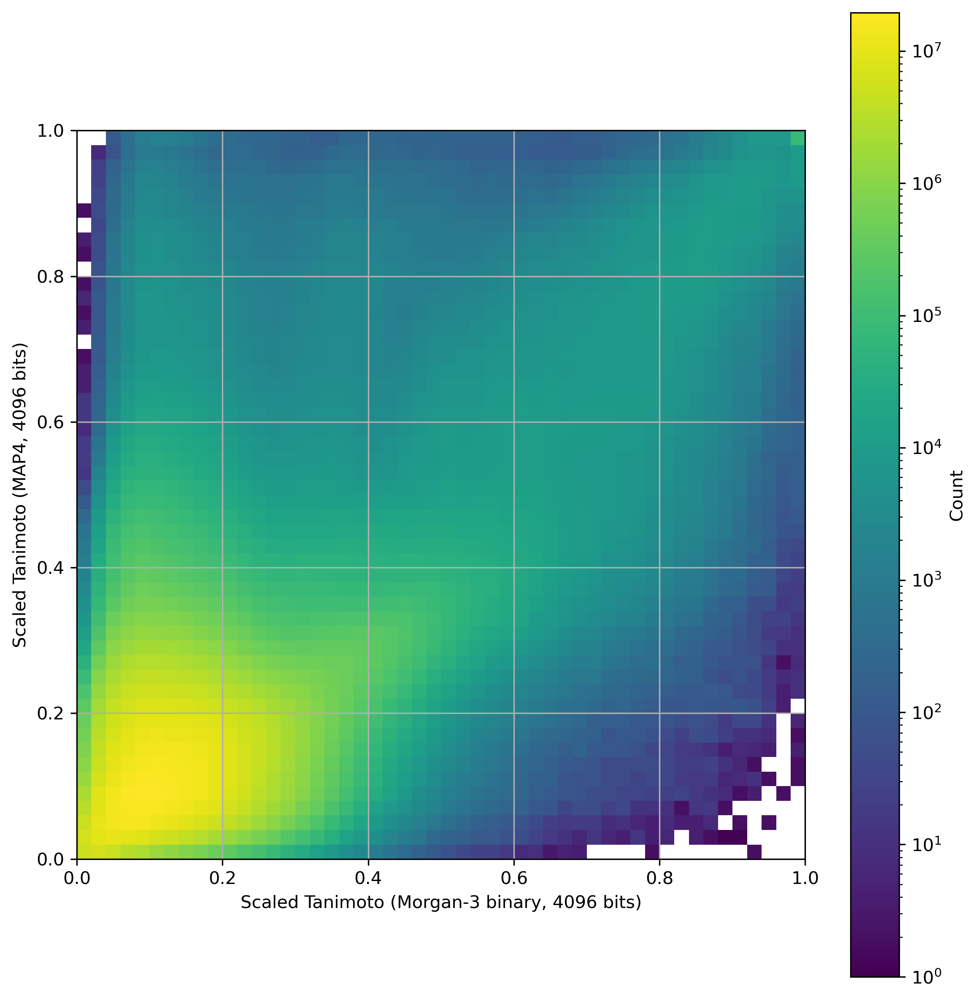

In [30]:
heatmap_comparison(
    scaled_similarities_morgan3,
    scaled_similarities_map4,
    f"Scaled Tanimoto (Morgan-3 binary, {NBITS} bits)",
    f"Scaled Tanimoto (MAP4, {NBITS} bits)",
    bins=50,
    filename="heatmap_scaled_tanimoto_morgan3_vs_scaled_tanimoto_map4.png"
)

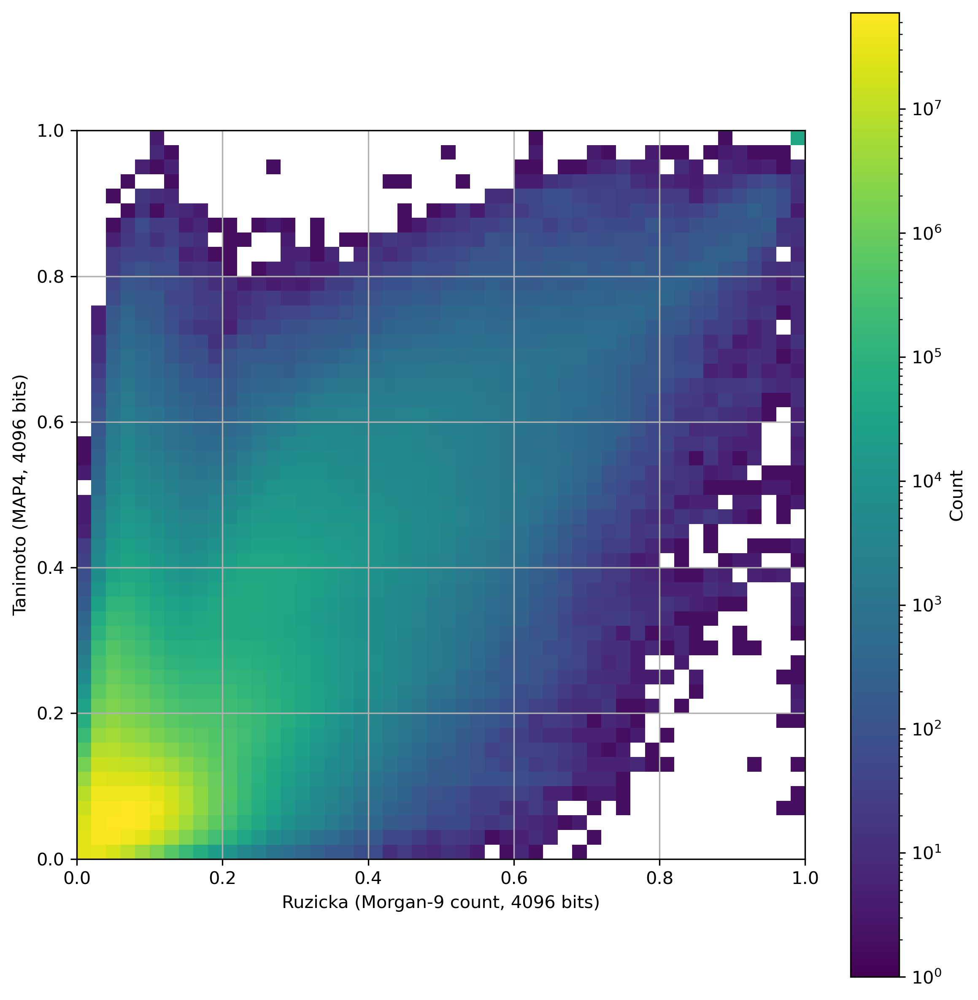

In [80]:
heatmap_comparison(
    similarities_morgan9_count,
    similarities_map4,
    f"Ruzicka (Morgan-9 count, {NBITS} bits)",
    f"Tanimoto (MAP4, {NBITS} bits)",
    bins=50,
    filename="heatmap_ruzicka_morgan9_vs_tanimoto_map4.png"
)

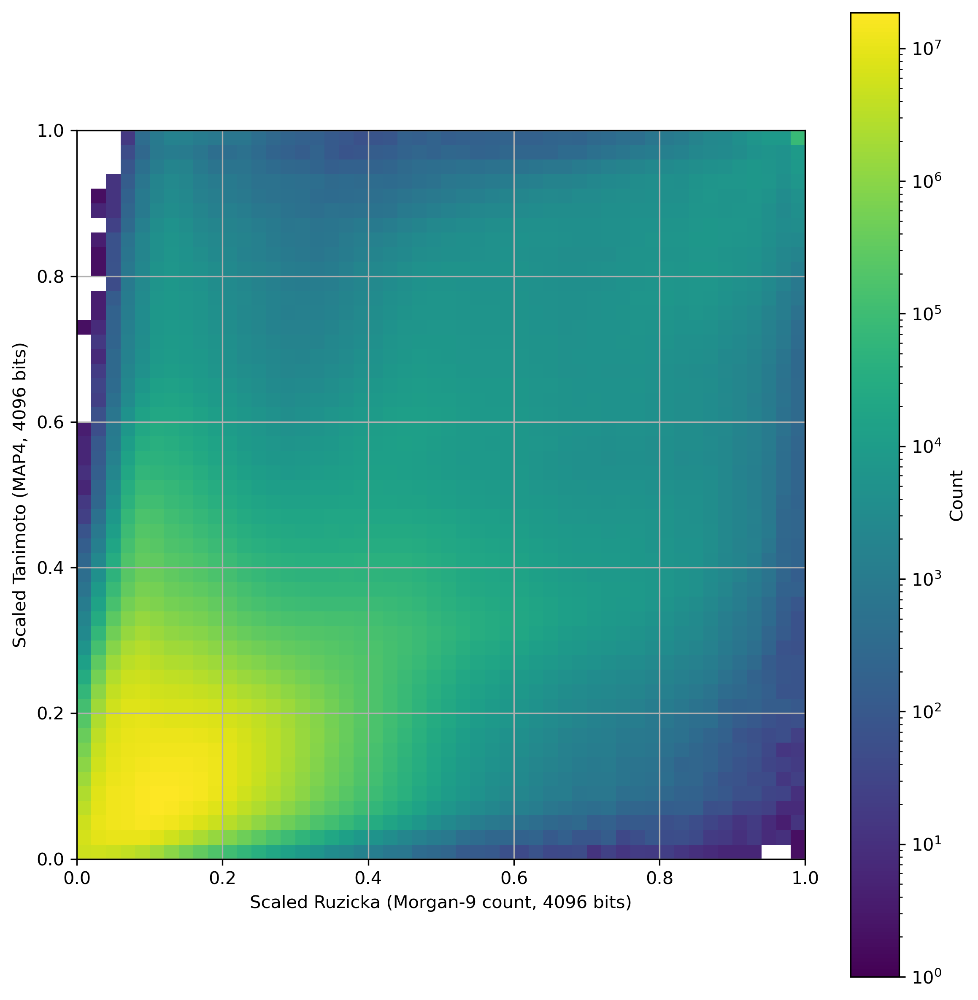

In [31]:
heatmap_comparison(
    scaled_similarities_morgan9_count,
    scaled_similarities_map4,
    f"Scaled Ruzicka (Morgan-9 count, {NBITS} bits)",
    f"Scaled Tanimoto (MAP4, {NBITS} bits)",
    bins=50,
    filename="heatmap_scaled_ruzicka_morgan9_vs_scaled_tanimoto_map4.png"
)